# Uber Fare Prediction 

## Preparation

Data Description:

1. key - a unique identifier for each trip
2. fare_amount - the cost of each trip in usd
3. pickup_datetime - date and time when the meter was engaged
4. passenger_count - the number of passengers in the vehicle (driver entered value)
5. pickup_longitude - the longitude where the meter was engaged
6. pickup_latitude - the latitude where the meter was engaged
7. dropoff_longitude - the longitude where the meter was disengaged
8. dropoff_latitude - the latitude where the meter was disengaged




What's to do :
1. Data Cleaning
2. Handle Outlier (If Required)
3. Data Manipulation
4. Feature Selection 
5. Feature Engineering
6. Model Evaluation
7. Hyperparameter Tuning


## Import Dataset

In [1]:
# Data manipulation and analysis
import pandas as pd
import numpy as np
from datetime import datetime
from datetime import timedelta
import re

# Data visualization
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

# Math Formula 
from math import radians, cos, sin, asin, sqrt
from scipy.stats import f_oneway

# geocode
import reverse_geocode

# VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Machine learning and data preprocessing
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.feature_selection import chi2, f_regression, SelectKBest
from sklearn.model_selection import train_test_split
from sklearn.metrics import silhouette_score, mean_squared_error, mean_absolute_error, r2_score

# Machine learning models
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from skopt import BayesSearchCV
from sklearn.model_selection import GridSearchCV

# Configuration and display options
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.5f}'.format

# Apply a specific style for matplotlib plots
plt.style.use('ggplot')

import joblib

## Data Cleaning

In [2]:
uber_data = pd.read_csv('uber.csv')

uber_data.head(5)

,Unnamed: 0,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,24238194,2015-05-07 19:52:06.0000003,7.50000,2015-05-07 19:52:06 UTC,-73.99982,40.73835,-73.99951,40.72322,1
1,27835199,2009-07-17 20:04:56.0000002,7.70000,2009-07-17 20:04:56 UTC,-73.99435,40.72823,-73.99471,40.75032,1
2,44984355,2009-08-24 21:45:00.00000061,12.90000,2009-08-24 21:45:00 UTC,-74.00504,40.74077,-73.96256,40.77265,1
3,25894730,2009-06-26 08:22:21.0000001,5.30000,2009-06-26 08:22:21 UTC,-73.97612,40.79084,-73.96532,40.80335,3
4,17610152,2014-08-28 17:47:00.000000188,16.00000,2014-08-28 17:47:00 UTC,-73.92502,40.74408,-73.97308,40.76125,5


In [3]:
# Split the 'key' column and create a new column 'key_id'
uber_data['key_id'] = uber_data['key'].str.split('.').str[-1]

uber_data.head()

,Unnamed: 0,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,key_id
0,24238194,2015-05-07 19:52:06.0000003,7.50000,2015-05-07 19:52:06 UTC,-73.99982,40.73835,-73.99951,40.72322,1,0000003
1,27835199,2009-07-17 20:04:56.0000002,7.70000,2009-07-17 20:04:56 UTC,-73.99435,40.72823,-73.99471,40.75032,1,0000002
2,44984355,2009-08-24 21:45:00.00000061,12.90000,2009-08-24 21:45:00 UTC,-74.00504,40.74077,-73.96256,40.77265,1,00000061
3,25894730,2009-06-26 08:22:21.0000001,5.30000,2009-06-26 08:22:21 UTC,-73.97612,40.79084,-73.96532,40.80335,3,0000001
4,17610152,2014-08-28 17:47:00.000000188,16.00000,2014-08-28 17:47:00 UTC,-73.92502,40.74408,-73.97308,40.76125,5,000000188


In [4]:
# Remove the 'Unnamed: 0' column
uber_data = uber_data.drop(columns=['Unnamed: 0'])

# Convert 'pickup_datetime' to datetime format
uber_data['pickup_datetime'] = pd.to_datetime(uber_data['pickup_datetime'], utc=True)

# Check for missing values
missing_values = uber_data.isnull().sum()

# Check data types
data_types = uber_data.dtypes

missing_values, data_types


(key                  0
 fare_amount          0
 pickup_datetime      0
 pickup_longitude     0
 pickup_latitude      0
 dropoff_longitude    1
 dropoff_latitude     1
 passenger_count      0
 key_id               0
 dtype: int64,
 key                               object
 fare_amount                      float64
 pickup_datetime      datetime64[ns, UTC]
 pickup_longitude                 float64
 pickup_latitude                  float64
 dropoff_longitude                float64
 dropoff_latitude                 float64
 passenger_count                    int64
 key_id                            object
 dtype: object)

In [5]:
# Remove rows with any missing values
uber_data_cleaned = uber_data.dropna()

# Confirm that there are no more missing values
final_missing_values = uber_data_cleaned.isnull().sum()

# Display the updated shape of the dataset
updated_shape = uber_data_cleaned.shape

final_missing_values, updated_shape


(key                  0
 fare_amount          0
 pickup_datetime      0
 pickup_longitude     0
 pickup_latitude      0
 dropoff_longitude    0
 dropoff_latitude     0
 passenger_count      0
 key_id               0
 dtype: int64,
 (199999, 9))

In [6]:
# Statistical summary of key columns
statistical_summary = uber_data_cleaned[['fare_amount', 'pickup_longitude', 'pickup_latitude', 
                                         'dropoff_longitude', 'dropoff_latitude', 'passenger_count']].describe().T

statistical_summary


,count,mean,std,min,25%,50%,75%,max
fare_amount,199999.00000,11.35989,9.90176,-52.00000,6.00000,8.50000,12.50000,499.00000
pickup_longitude,199999.00000,-72.52763,11.43782,-1340.64841,-73.99206,-73.98182,-73.96715,57.41846
pickup_latitude,199999.00000,39.93588,7.72056,-74.01552,40.73480,40.75259,40.76716,1644.42148
dropoff_longitude,199999.00000,-72.52529,13.11741,-3356.66630,-73.99141,-73.98009,-73.96366,1153.57260
dropoff_latitude,199999.00000,39.92389,6.79483,-881.98551,40.73382,40.75304,40.76800,872.69763
passenger_count,199999.00000,1.68454,1.38599,0.00000,1.00000,1.00000,2.00000,208.00000


In [7]:
# Remove entries with negative fare amounts and cap the maximum fare at a threshold (considering 250 as a high but plausible fare)
uber_data_cleaned = uber_data_cleaned[(uber_data_cleaned['fare_amount'] > 0) & (uber_data_cleaned['fare_amount'] <= 250)]

# Defining NYC coordinate boundaries
min_longitude, max_longitude = -74.25, -73.7
min_latitude, max_latitude = 40.5, 40.9

# Remove entries with geospatial coordinates outside the plausible range for NYC trips
uber_data_cleaned = uber_data_cleaned[(uber_data_cleaned['pickup_longitude'] >= min_longitude) & (uber_data_cleaned['pickup_longitude'] <= max_longitude) &
                                      (uber_data_cleaned['pickup_latitude'] >= min_latitude) & (uber_data_cleaned['pickup_latitude'] <= max_latitude) &
                                      (uber_data_cleaned['dropoff_longitude'] >= min_longitude) & (uber_data_cleaned['dropoff_longitude'] <= max_longitude) &
                                      (uber_data_cleaned['dropoff_latitude'] >= min_latitude) & (uber_data_cleaned['dropoff_latitude'] <= max_latitude)]

# Remove entries with unrealistic passenger counts (assuming 1 to 6 as a realistic range)
uber_data_cleaned = uber_data_cleaned[(uber_data_cleaned['passenger_count'] > 0) & (uber_data_cleaned['passenger_count'] <= 6)]

updated_shape = uber_data_cleaned.shape
fare_summary = uber_data_cleaned['fare_amount'].describe()

updated_shape, fare_summary




((194776, 9),
 count   194776.00000
 mean        11.29143
 std          9.43840
 min          0.01000
 25%          6.00000
 50%          8.50000
 75%         12.50000
 max        220.00000
 Name: fare_amount, dtype: float64)

## Apply Haversine formula to acquire distances(Km)

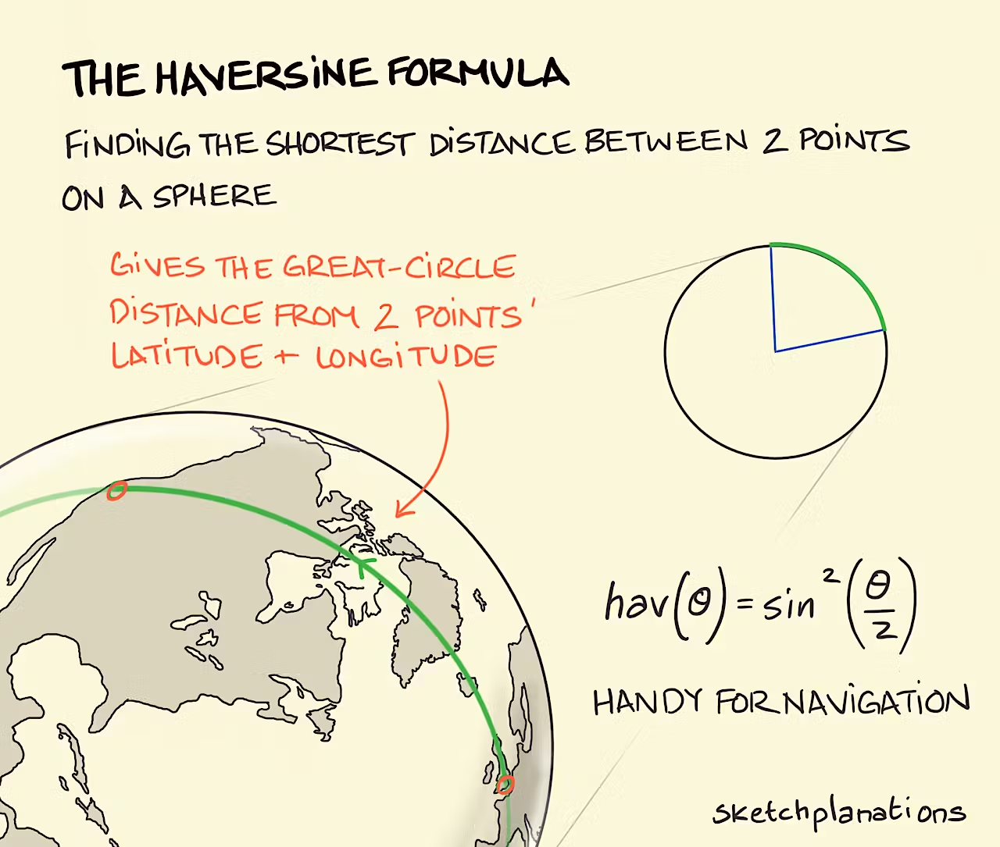

In [8]:

def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance in kilometers between two points 
    on the earth (specified in decimal degrees).
    """
    # Convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])

    # Haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6371 # Radius of earth in kilometers. Use 3956 for miles
    return c * r

# Apply the Haversine formula to calculate distances between pickup and dropoff points
uber_data_cleaned['trip_distance_km'] = uber_data_cleaned.apply(lambda row: haversine(row['pickup_longitude'], row['pickup_latitude'], 
                                                                                       row['dropoff_longitude'], row['dropoff_latitude']), axis=1)

uber_data_cleaned[['key','trip_distance_km']].head()



,key,trip_distance_km
0,2015-05-07 19:52:06.0000003,1.68332
1,2009-07-17 20:04:56.0000002,2.45759
2,2009-08-24 21:45:00.00000061,5.03638
3,2009-06-26 08:22:21.0000001,1.66168
4,2014-08-28 17:47:00.000000188,4.47545


In [9]:
uber_data_cleaned.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,key_id,trip_distance_km
0,2015-05-07 19:52:06.0000003,7.50000,2015-05-07 19:52:06+00:00,-73.99982,40.73835,-73.99951,40.72322,1,0000003,1.68332
1,2009-07-17 20:04:56.0000002,7.70000,2009-07-17 20:04:56+00:00,-73.99435,40.72823,-73.99471,40.75032,1,0000002,2.45759
2,2009-08-24 21:45:00.00000061,12.90000,2009-08-24 21:45:00+00:00,-74.00504,40.74077,-73.96256,40.77265,1,00000061,5.03638
3,2009-06-26 08:22:21.0000001,5.30000,2009-06-26 08:22:21+00:00,-73.97612,40.79084,-73.96532,40.80335,3,0000001,1.66168
4,2014-08-28 17:47:00.000000188,16.00000,2014-08-28 17:47:00+00:00,-73.92502,40.74408,-73.97308,40.76125,5,000000188,4.47545


In [10]:
uber_data_cleaned[uber_data_cleaned['trip_distance_km']== 0].head(5)

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,key_id,trip_distance_km
5,2011-02-12 02:27:09.0000006,4.90000,2011-02-12 02:27:09+00:00,-73.96902,40.75591,-73.96902,40.75591,1,0000006,0.00000
48,2013-01-03 22:24:41.0000002,56.80000,2013-01-03 22:24:41+00:00,-73.99350,40.76469,-73.99350,40.76469,1,0000002,0.00000
84,2009-08-07 10:43:07.0000001,49.57000,2009-08-07 10:43:07+00:00,-73.97506,40.78882,-73.97506,40.78882,1,0000001,0.00000
166,2014-01-22 21:01:18.0000004,4.50000,2014-01-22 21:01:18+00:00,-73.99294,40.75778,-73.99294,40.75778,1,0000004,0.00000
361,2009-08-24 17:25:00.00000056,10.10000,2009-08-24 17:25:00+00:00,-73.92871,40.75348,-73.92871,40.75348,1,00000056,0.00000


In [11]:
# # Filter out rows where 'trip_distance_km' is 0
# uber_data_no_zeros = uber_data_cleaned[uber_data_cleaned['trip_distance_km'] < 0]

# # Display the updated shape of the dataset and the new summary statistics for 'trip_distance_km'
# updated_shape_no_zeros = uber_data_no_zeros.shape
# new_trip_distance_summary_no_zeros = uber_data_no_zeros['trip_distance_km'].describe()

# updated_shape_no_zeros, new_trip_distance_summary_no_zeros


In [12]:
# Filter out rows where 'trip_distance_km' is 0.5
uber_data_no_zeros = uber_data_cleaned[uber_data_cleaned['trip_distance_km'] > 0.5]

# check the shape of the data and the basic statistics to ensure the operation was successful
print(uber_data_no_zeros.shape)
print(uber_data_no_zeros['trip_distance_km'].describe())


(186895, 10)
count   186895.00000
mean         3.43570
std          3.56629
min          0.50005
25%          1.35121
50%          2.24928
75%          4.02502
max         35.34186
Name: trip_distance_km, dtype: float64


## Extract Pickup_date and Pickup_time

In [13]:
# Extract date and time from 'pickup_datetime' and create new columns for each
uber_data_no_zeros['pickup_date'] = uber_data_no_zeros['pickup_datetime'].dt.date
uber_data_no_zeros['pickup_time'] = uber_data_no_zeros['pickup_datetime'].dt.time

# Display the first few rows to confirm the addition of the new columns
uber_data_no_zeros[['pickup_datetime', 'pickup_date', 'pickup_time']].head()


/var/folders/41/b417hb0j4gqcv7xp7r2g8fl40000gn/T/ipykernel_6669/3073258546.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  uber_data_no_zeros['pickup_date'] = uber_data_no_zeros['pickup_datetime'].dt.date
/var/folders/41/b417hb0j4gqcv7xp7r2g8fl40000gn/T/ipykernel_6669/3073258546.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  uber_data_no_zeros['pickup_time'] = uber_data_no_zeros['pickup_datetime'].dt.time


,pickup_datetime,pickup_date,pickup_time
0,2015-05-07 19:52:06+00:00,2015-05-07,19:52:06
1,2009-07-17 20:04:56+00:00,2009-07-17,20:04:56
2,2009-08-24 21:45:00+00:00,2009-08-24,21:45:00
3,2009-06-26 08:22:21+00:00,2009-06-26,08:22:21
4,2014-08-28 17:47:00+00:00,2014-08-28,17:47:00


In [14]:
uber_data_no_zeros.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,key_id,trip_distance_km,pickup_date,pickup_time
0,2015-05-07 19:52:06.0000003,7.50000,2015-05-07 19:52:06+00:00,-73.99982,40.73835,-73.99951,40.72322,1,0000003,1.68332,2015-05-07,19:52:06
1,2009-07-17 20:04:56.0000002,7.70000,2009-07-17 20:04:56+00:00,-73.99435,40.72823,-73.99471,40.75032,1,0000002,2.45759,2009-07-17,20:04:56
2,2009-08-24 21:45:00.00000061,12.90000,2009-08-24 21:45:00+00:00,-74.00504,40.74077,-73.96256,40.77265,1,00000061,5.03638,2009-08-24,21:45:00
3,2009-06-26 08:22:21.0000001,5.30000,2009-06-26 08:22:21+00:00,-73.97612,40.79084,-73.96532,40.80335,3,0000001,1.66168,2009-06-26,08:22:21
4,2014-08-28 17:47:00.000000188,16.00000,2014-08-28 17:47:00+00:00,-73.92502,40.74408,-73.97308,40.76125,5,000000188,4.47545,2014-08-28,17:47:00


## Extract Pickup_country, pickup_city, dropoff_country, dropoff_city

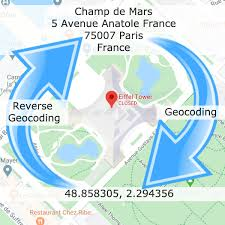

In [15]:
# pip install reverse-geocode

In [16]:
import reverse_geocode

# Assuming your DataFrame is named df and already loaded
# Ensure your DataFrame has 'pickup_latitude', 'pickup_longitude', 'dropoff_latitude', and 'dropoff_longitude' columns

def reverse_geocode_locations(uber_data_no_zeros):
    # Combine latitude and longitude into a tuple for pickup and dropoff locations
    pickup_coordinates = list(zip(uber_data_no_zeros['pickup_latitude'], uber_data_no_zeros['pickup_longitude']))
    dropoff_coordinates = list(zip(uber_data_no_zeros['dropoff_latitude'], uber_data_no_zeros['dropoff_longitude']))
    
    # Perform batch reverse geocoding
    pickup_locations = reverse_geocode.search(pickup_coordinates)
    dropoff_locations = reverse_geocode.search(dropoff_coordinates)
    
    # Convert location information into DataFrame columns
    uber_data_no_zeros['pickup_country'] = [location['country'] for location in pickup_locations]
    uber_data_no_zeros['pickup_city'] = [location['city'] for location in pickup_locations]
    uber_data_no_zeros['dropoff_country'] = [location['country'] for location in dropoff_locations]
    uber_data_no_zeros['dropoff_city'] = [location['city'] for location in dropoff_locations]
    
    return uber_data_no_zeros

# Apply the function to your DataFrame
# df = reverse_geocode_locations(df)

# Note: Replace df with your actual DataFrame variable


uber_data_no_zeros = reverse_geocode_locations(uber_data_no_zeros)


/var/folders/41/b417hb0j4gqcv7xp7r2g8fl40000gn/T/ipykernel_6669/983873788.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  uber_data_no_zeros['pickup_country'] = [location['country'] for location in pickup_locations]
/var/folders/41/b417hb0j4gqcv7xp7r2g8fl40000gn/T/ipykernel_6669/983873788.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  uber_data_no_zeros['pickup_city'] = [location['city'] for location in pickup_locations]
/var/folders/41/b417hb0j4gqcv7xp7r2g8fl40000gn/T/ipykernel_6669/983873788.py

In [17]:
uber_data_no_zeros.info()

<class 'pandas.core.frame.DataFrame'>
Index: 186895 entries, 0 to 199999
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype              
---  ------             --------------   -----              
 0   key                186895 non-null  object             
 1   fare_amount        186895 non-null  float64            
 2   pickup_datetime    186895 non-null  datetime64[ns, UTC]
 3   pickup_longitude   186895 non-null  float64            
 4   pickup_latitude    186895 non-null  float64            
 5   dropoff_longitude  186895 non-null  float64            
 6   dropoff_latitude   186895 non-null  float64            
 7   passenger_count    186895 non-null  int64              
 8   key_id             186895 non-null  object             
 9   trip_distance_km   186895 non-null  float64            
 10  pickup_date        186895 non-null  object             
 11  pickup_time        186895 non-null  object             
 12  pickup_country     186895 non-null 

In [18]:
uber_data_no_zeros[['key', 'pickup_country', 'dropoff_city']].head()


,key,pickup_country,dropoff_city
0,2015-05-07 19:52:06.0000003,United States,Chinatown
1,2009-07-17 20:04:56.0000002,United States,Hell's Kitchen
2,2009-08-24 21:45:00.00000061,United States,Manhattan
3,2009-06-26 08:22:21.0000001,United States,Morningside Heights
4,2014-08-28 17:47:00.000000188,United States,Hell's Kitchen


In [19]:
uber_data_no_zeros.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,key_id,trip_distance_km,pickup_date,pickup_time,pickup_country,pickup_city,dropoff_country,dropoff_city
0,2015-05-07 19:52:06.0000003,7.50000,2015-05-07 19:52:06+00:00,-73.99982,40.73835,-73.99951,40.72322,1,0000003,1.68332,2015-05-07,19:52:06,United States,Gramercy Park,United States,Chinatown
1,2009-07-17 20:04:56.0000002,7.70000,2009-07-17 20:04:56+00:00,-73.99435,40.72823,-73.99471,40.75032,1,0000002,2.45759,2009-07-17,20:04:56,United States,East Village,United States,Hell's Kitchen
2,2009-08-24 21:45:00.00000061,12.90000,2009-08-24 21:45:00+00:00,-74.00504,40.74077,-73.96256,40.77265,1,00000061,5.03638,2009-08-24,21:45:00,United States,Gramercy Park,United States,Manhattan
3,2009-06-26 08:22:21.0000001,5.30000,2009-06-26 08:22:21+00:00,-73.97612,40.79084,-73.96532,40.80335,3,0000001,1.66168,2009-06-26,08:22:21,United States,Manhattan,United States,Morningside Heights
4,2014-08-28 17:47:00.000000188,16.00000,2014-08-28 17:47:00+00:00,-73.92502,40.74408,-73.97308,40.76125,5,000000188,4.47545,2014-08-28,17:47:00,United States,Sunnyside,United States,Hell's Kitchen


In [20]:
uber_data_no_zeros[['fare_amount','trip_distance_km']].describe()

,fare_amount,trip_distance_km
count,186895.00000,186895.00000
mean,11.43326,3.43570
std,9.33090,3.56629
min,0.01000,0.50005
25%,6.10000,1.35121
50%,8.50000,2.24928
75%,12.90000,4.02502
max,220.00000,35.34186


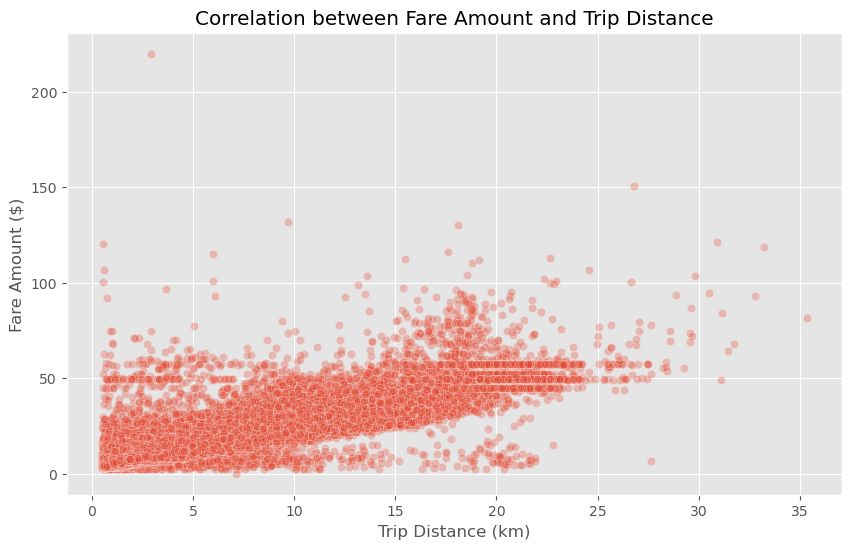

In [21]:
# Creating a scatter plot to visualize the correlation between fare amount and trip distance
plt.figure(figsize=(10, 6))
sns.scatterplot(data=uber_data_no_zeros, x='trip_distance_km', y='fare_amount', alpha=0.3
            )

plt.title('Correlation between Fare Amount and Trip Distance')
plt.xlabel('Trip Distance (km)')
plt.ylabel('Fare Amount ($)')

plt.show()



## Backup Cleaning Data 


In [22]:
# uber_data_no_zeros.to_csv('uber_data_preprocessed.csv')

In [23]:
# uber_data_preprocessed = uber_data_no_zeros.copy()

In [24]:
uber_data_clear_outlier =uber_data_no_zeros.copy()

## Clear Outlier


In [25]:

def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Filtering the data without outliers
    filtered_df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return filtered_df

# Removing outliers from 'fare_amount'
uber_data_clear_outlier = remove_outliers(uber_data_clear_outlier, 'fare_amount')

# Removing outliers from 'trip_distance_km'
uber_data_clear_outlier = remove_outliers(uber_data_clear_outlier, 'trip_distance_km')


In [26]:
uber_data_clear_outlier.info()

<class 'pandas.core.frame.DataFrame'>
Index: 164123 entries, 0 to 199999
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype              
---  ------             --------------   -----              
 0   key                164123 non-null  object             
 1   fare_amount        164123 non-null  float64            
 2   pickup_datetime    164123 non-null  datetime64[ns, UTC]
 3   pickup_longitude   164123 non-null  float64            
 4   pickup_latitude    164123 non-null  float64            
 5   dropoff_longitude  164123 non-null  float64            
 6   dropoff_latitude   164123 non-null  float64            
 7   passenger_count    164123 non-null  int64              
 8   key_id             164123 non-null  object             
 9   trip_distance_km   164123 non-null  float64            
 10  pickup_date        164123 non-null  object             
 11  pickup_time        164123 non-null  object             
 12  pickup_country     164123 non-null 

In [27]:
# # Setting up the figure size and style for better visibility
# plt.figure(figsize=(14, 6))
# sns.set_style("whitegrid")

# # Plotting both fare amount and trip distance to visually check for outliers
# plt.subplot(1, 2, 1)
# sns.boxplot(y=uber_data_clear_outlier['fare_amount'])
# plt.title('Fare Amount Distribution')

# plt.subplot(1, 2, 2)
# sns.boxplot(y=uber_data_clear_outlier['trip_distance_km'])
# plt.title('Trip Distance Distribution')

# plt.tight_layout()
# plt.show()

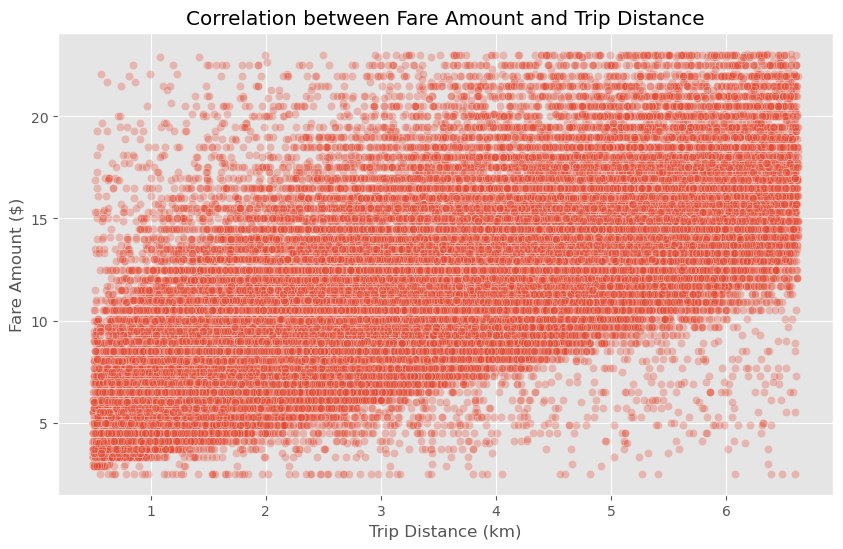

In [28]:
# Creating a scatter plot to visualize the correlation between fare amount and trip distance
plt.figure(figsize=(10, 6))
sns.scatterplot(data=uber_data_clear_outlier, x='trip_distance_km', y='fare_amount', alpha=0.3
            )

plt.title('Correlation between Fare Amount and Trip Distance')
plt.xlabel('Trip Distance (km)')
plt.ylabel('Fare Amount ($)')

plt.savefig('scatter fare amount and trip distance before clear.png')
plt.show()


Based on exploration i found on google, minimum fare is 2.5$, so we need to eliminate fare below 2.5

In [29]:
# # Filter out rows where 'trip_distance_km' is 0.5
# uber_data_preprocessed = uber_data_no_zeros[uber_data_no_zeros['fare_amount'] > 2.50]

# # check the shape of the data and the basic statistics to ensure the operation was successful
# print(uber_data_preprocessed.shape)
# print(uber_data_preprocessed['trip_distance_km'].describe())


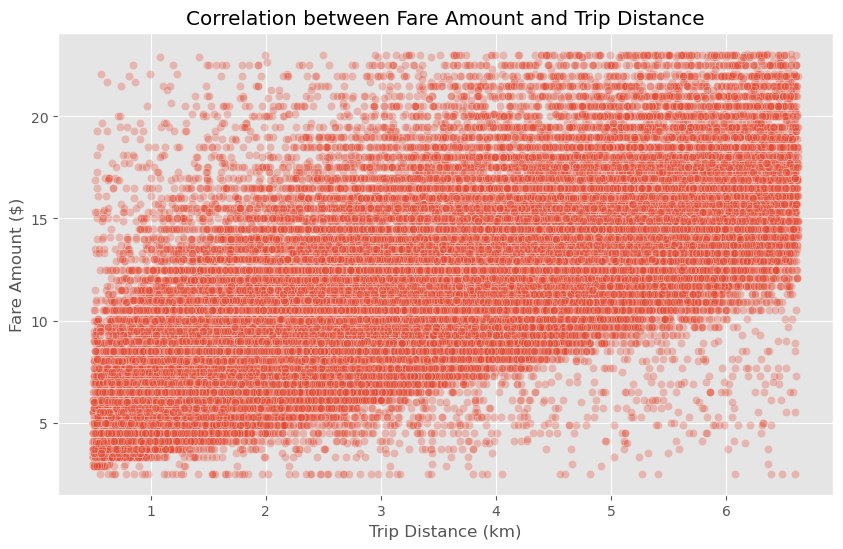

In [30]:
# Creating a scatter plot to visualize the correlation between fare amount and trip distance
plt.figure(figsize=(10, 6))
sns.scatterplot(data=uber_data_clear_outlier, x='trip_distance_km', y='fare_amount', alpha=0.3
            )

plt.title('Correlation between Fare Amount and Trip Distance')
plt.xlabel('Trip Distance (km)')
plt.ylabel('Fare Amount ($)')

plt.show()



In [31]:
uber_data_clear_outlier.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,trip_distance_km
count,164123.00000,164123.00000,164123.00000,164123.00000,164123.00000,164123.00000,164123.00000
mean,8.75473,-73.98065,40.75225,-73.97935,40.75229,1.68719,2.38118
std,3.76213,0.01973,0.02288,0.02080,0.02450,1.30356,1.42905
min,2.50000,-74.22510,40.51090,-74.22657,40.51966,1.00000,0.50005
25%,6.00000,-73.99254,40.73764,-73.99193,40.73748,1.00000,1.26110
50%,8.00000,-73.98258,40.75324,-73.98159,40.75376,1.00000,1.99837
75%,10.90000,-73.97081,40.76665,-73.96928,40.76716,2.00000,3.16852
max,23.07000,-73.70274,40.89257,-73.70065,40.89899,6.00000,6.62226


Let's count the normal fare 

In [32]:
def calculate_uber_fare(distance_km, base_fare, cost_per_minute, cost_per_mile, surge_multiplier=1.0):
    distance_miles = distance_km * 0.621371  # Convert km to miles
    average_speed_kmh = 30  # Simplistic average speed assumption
    time_in_car_minutes = distance_km / average_speed_kmh * 60  # Convert hours to minutes
    
    # Calculate fare
    fare = (base_fare + 
            (cost_per_minute * time_in_car_minutes) + 
            (cost_per_mile * distance_miles)) * surge_multiplier
    
    return round(fare, 2)  # Round to 2 decimal places for convenience

# Fare settings for UberX and UberXL under normal conditions
uberx_rates = {'base_fare': 2.55, 'cost_per_minute': 0.35, 'cost_per_mile': 1.75}
uberxl_rates = {'base_fare': 3.85, 'cost_per_minute': 0.5, 'cost_per_mile': 2.85}

# Surge multiplier
surge_multiplier = 1.5

# Calculate and print fares for distances from 1 km to 7 km
for distance in range(1, 8):  # 1 km to 7 km
    uberx_fare_normal = calculate_uber_fare(distance, **uberx_rates)
    uberxl_fare_normal = calculate_uber_fare(distance, **uberxl_rates)
    uberx_fare_surge = calculate_uber_fare(distance, **uberx_rates, surge_multiplier=surge_multiplier)
    uberxl_fare_surge = calculate_uber_fare(distance, **uberxl_rates, surge_multiplier=surge_multiplier)
    
    print(f"Distance: {distance} km")
    print(f" UberX (Normal): ${uberx_fare_normal}, UberX (Surge): ${uberx_fare_surge}")
    print(f" UberXL (Normal): ${uberxl_fare_normal}, UberXL (Surge): ${uberxl_fare_surge}")
    print("---")


Distance: 1 km
 UberX (Normal): $4.34, UberX (Surge): $6.51
 UberXL (Normal): $6.62, UberXL (Surge): $9.93
---
Distance: 2 km
 UberX (Normal): $6.12, UberX (Surge): $9.19
 UberXL (Normal): $9.39, UberXL (Surge): $14.09
---
Distance: 3 km
 UberX (Normal): $7.91, UberX (Surge): $11.87
 UberXL (Normal): $12.16, UberXL (Surge): $18.24
---
Distance: 4 km
 UberX (Normal): $9.7, UberX (Surge): $14.55
 UberXL (Normal): $14.93, UberXL (Surge): $22.4
---
Distance: 5 km
 UberX (Normal): $11.49, UberX (Surge): $17.23
 UberXL (Normal): $17.7, UberXL (Surge): $26.56
---
Distance: 6 km
 UberX (Normal): $13.27, UberX (Surge): $19.91
 UberXL (Normal): $20.48, UberXL (Surge): $30.71
---
Distance: 7 km
 UberX (Normal): $15.06, UberX (Surge): $22.59
 UberXL (Normal): $23.25, UberXL (Surge): $34.87
---


In [33]:
# Re-define the function using the parameters provided by the user
def calculate_uber_fare(distance_km, base_fare, cost_per_minute, cost_per_km, surge_multiplier):
    """
    Calculate the Uber fare based on distance in kilometers, cost per minute, cost per kilometer,
    and a surge multiplier.
    """
    # Convert cost per km to cost per mile since the original formula is in miles
    cost_per_mile = cost_per_km * 0.621371
    # Assuming an average speed of 45 km/h, calculate the time in car in minutes
    time_in_car_minutes = distance_km / 45 * 60
    
    # Calculate the fare
    fare = (base_fare +
            (cost_per_minute * time_in_car_minutes) +
            (cost_per_mile * distance_km * 0.621371)) * surge_multiplier
    
    return fare

# Apply the fare calculation to each row in the DataFrame
uber_data_clear_outlier['expected_fare'] = uber_data_clear_outlier['trip_distance_km'].apply(
    lambda x: calculate_uber_fare(x, 2.5, 0.35, 1.75, 2)
)

# Define lower and upper bounds for outlier detection
lower_bound_multiplier = 0.5  # 50% less than the expected fare
upper_bound_multiplier = 1.8  # 80% more than the expected fare

# Calculate lower and upper bounds
uber_data_clear_outlier['fare_lower_bound'] = uber_data_clear_outlier['expected_fare'] * lower_bound_multiplier
uber_data_clear_outlier['fare_upper_bound'] = uber_data_clear_outlier['expected_fare'] * upper_bound_multiplier

# Filter out outliers
filtered_df = uber_data_clear_outlier[
    (uber_data_clear_outlier['fare_amount'] >= uber_data_clear_outlier['fare_lower_bound']) &
    (uber_data_clear_outlier['fare_amount'] <= uber_data_clear_outlier['fare_upper_bound'])
]

# Drop the helper columns used for filtering
filtered_df.drop(['expected_fare', 'fare_lower_bound', 'fare_upper_bound'], axis=1, inplace=True)

# Let's see the shape of the filtered DataFrame
filtered_df.shape
filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 162112 entries, 0 to 199999
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype              
---  ------             --------------   -----              
 0   key                162112 non-null  object             
 1   fare_amount        162112 non-null  float64            
 2   pickup_datetime    162112 non-null  datetime64[ns, UTC]
 3   pickup_longitude   162112 non-null  float64            
 4   pickup_latitude    162112 non-null  float64            
 5   dropoff_longitude  162112 non-null  float64            
 6   dropoff_latitude   162112 non-null  float64            
 7   passenger_count    162112 non-null  int64              
 8   key_id             162112 non-null  object             
 9   trip_distance_km   162112 non-null  float64            
 10  pickup_date        162112 non-null  object             
 11  pickup_time        162112 non-null  object             
 12  pickup_country     162112 non-null 

/var/folders/41/b417hb0j4gqcv7xp7r2g8fl40000gn/T/ipykernel_6669/1688455320.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df.drop(['expected_fare', 'fare_lower_bound', 'fare_upper_bound'], axis=1, inplace=True)


In [34]:
# # def calculate_uber_fare(distance_km, base_fare, cost_per_minute, cost_per_mile, surge_multiplier=1):
# #     distance_miles = distance_km * 0.621371  # Convert km to miles
# #     average_speed_kmh = 45  # Simplistic average speed assumption
# #     time_in_car_minutes = distance_km / average_speed_kmh * 60  # Convert hours to minutes
    
# #     # Calculate fare
# #     fare = (base_fare + 
# #             (cost_per_minute * time_in_car_minutes) + 
# #             (cost_per_mile * distance_miles)) * surge_multiplier
    
# #     return round(fare, 2)  # Round to 2 decimal places for convenience


# # Define a base fare formula as an example, user will replace with actual values
# def calculate_base_fare(distance, base_rate, per_km_rate, surge_multiplier=1):
#     """
#     Calculate the base fare using a simple formula
#     distance: float, the distance of the trip in kilometers
#     base_rate: float, the base fare to start with
#     per_km_rate: float, the fare per kilometer
#     surge_multiplier: float, the surge pricing multiplier
#     """
#     return (base_rate + (per_km_rate * distance)) * surge_multiplier



# # Example rates, to be replaced with actual values provided by the user
# base_rate = 2.5  # Example base fare
# per_km_rate = 1.75  # Example rate per km


# # Surge multiplier - Assuming no surge for simplicity, user can adjust as needed
# surge_multiplier = 2

# # Apply the formula to the trip_distance_km column to calculate the expected fare
# uber_data_preprocessed['expected_fare'] = uber_data_preprocessed.apply(
#     lambda x: calculate_base_fare(x['trip_distance_km'], base_rate, per_km_rate, surge_multiplier),
#     axis=1
# )

# # For simplicity, let's consider fares within 50% of the expected fare as non-outliers
# # This threshold can be adjusted by the user
# lower_bound_multiplier = 0.4  # 50% less than the expected fare
# upper_bound_multiplier = 2 # 50% more than the expected fare

# # Calculate the lower and upper bounds
# uber_data_preprocessed['fare_lower_bound'] = uber_data_preprocessed['expected_fare'] * lower_bound_multiplier
# uber_data_preprocessed['fare_upper_bound'] = uber_data_preprocessed['expected_fare'] * upper_bound_multiplier

# # Filter out outliers: fares that are below the lower bound or above the upper bound
# non_outliers = uber_data_preprocessed[
#     (uber_data_preprocessed['fare_amount'] >= uber_data_preprocessed['fare_lower_bound']) &
#     (uber_data_preprocessed['fare_amount'] <= uber_data_preprocessed['fare_upper_bound'])
# ]

# # Drop the columns used for filtering
# non_outliers = non_outliers.drop(columns=['expected_fare', 'fare_lower_bound', 'fare_upper_bound'])

# # Show the shape of the DataFrame after removing outliers
# non_outliers.shape


In [35]:
filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 162112 entries, 0 to 199999
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype              
---  ------             --------------   -----              
 0   key                162112 non-null  object             
 1   fare_amount        162112 non-null  float64            
 2   pickup_datetime    162112 non-null  datetime64[ns, UTC]
 3   pickup_longitude   162112 non-null  float64            
 4   pickup_latitude    162112 non-null  float64            
 5   dropoff_longitude  162112 non-null  float64            
 6   dropoff_latitude   162112 non-null  float64            
 7   passenger_count    162112 non-null  int64              
 8   key_id             162112 non-null  object             
 9   trip_distance_km   162112 non-null  float64            
 10  pickup_date        162112 non-null  object             
 11  pickup_time        162112 non-null  object             
 12  pickup_country     162112 non-null 

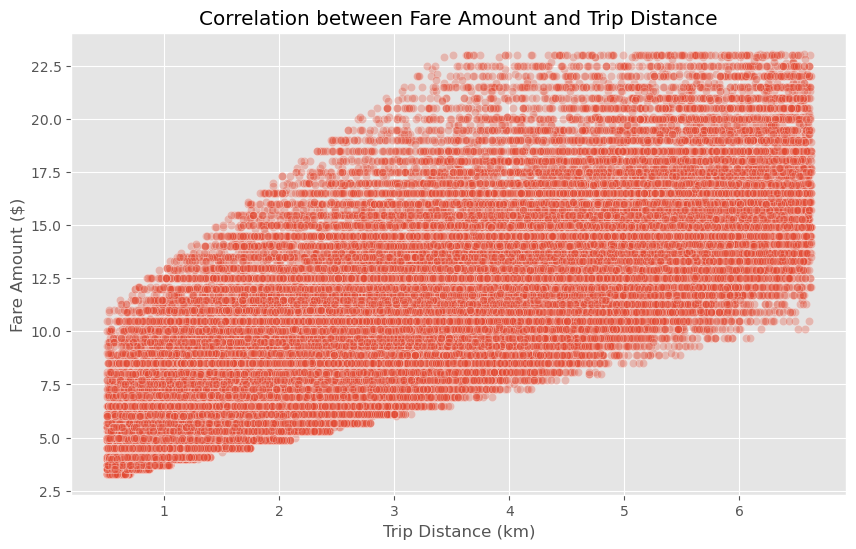

In [36]:
# Creating a scatter plot to visualize the correlation between fare amount and trip distance
plt.figure(figsize=(10, 6))
sns.scatterplot(data=filtered_df, x='trip_distance_km', y='fare_amount', alpha=0.3
            )

plt.title('Correlation between Fare Amount and Trip Distance')
plt.xlabel('Trip Distance (km)')
plt.ylabel('Fare Amount ($)')

plt.savefig('scatter fare amount and trip distance after clear.png')
plt.show()


In [37]:


# # Define a function to calculate Uber fares and identify outliers using IQR method
# def calculate_fares_and_remove_outliers():
#     # Placeholder distances and fares based on previous calculation logic
#     distances = range(1, 8)  # From 1 km to 7 km
#     uberx_fares_normal = [2.75, 4.5, 6.25, 8, 9.75, 11.5, 13.25]
#     uberx_fares_surge = [x * 1.5 for x in uberx_fares_normal]
#     uberxl_fares_normal = [4, 6.35, 8.7, 11.05, 13.4, 15.75, 18.1]
#     uberxl_fares_surge = [x * 1.5 for x in uberxl_fares_normal]
    
#     # Combine all fares into a single list for simplicity
#     all_fares = uberx_fares_normal + uberx_fares_surge + uberxl_fares_normal + uberxl_fares_surge
    
#     # Convert to DataFrame for easier handling
#     fare_data = pd.DataFrame(uber_data_preprocessed, columns=['fare_amount'])
    
#     # Calculate Q1, Q3, and IQR
#     Q1 = fare_data['fare_amount'].quantile(0.25)
#     Q3 = fare_data['fare_amount'].quantile(0.75)
#     IQR = Q3 - Q1
    
#     # Determine outliers
#     lower_bound = Q1 - 1.5 * IQR
#     upper_bound = Q3 + 1.5 * IQR
#     outliers_removed = fare_data[(fare_data['fare_amount'] >= lower_bound) & (fare_data['fare_amount'] <= upper_bound)]
    
#     return outliers_removed

# # Remove outliers from the calculated fares
# cleaned_fares = calculate_fares_and_remove_outliers()

# cleaned_fares.head()


In [38]:
uber_data_preprocessed=filtered_df.copy()

## Exploratory Data Analysis


### Distribution of fare amounts and trip distances

/Users/andi/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/andi/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


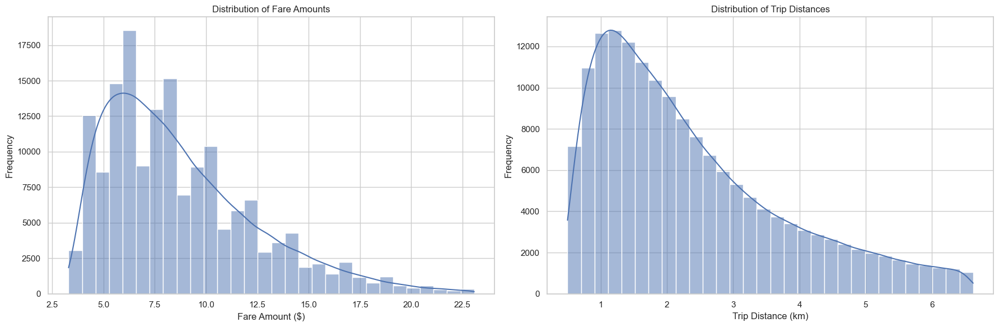

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting the aesthetics for the plots
sns.set(style="whitegrid")

# Creating the distribution plots
fig, ax = plt.subplots(1, 2, figsize=(18, 6))

# Distribution of fare amounts
sns.histplot(uber_data_preprocessed['fare_amount'], bins=30, kde=True, ax=ax[0])
ax[0].set_title('Distribution of Fare Amounts')
ax[0].set_xlabel('Fare Amount ($)')
ax[0].set_ylabel('Frequency')

# Distribution of trip distances
sns.histplot(uber_data_preprocessed['trip_distance_km'], bins=30, kde=True, ax=ax[1])
ax[1].set_title('Distribution of Trip Distances')
ax[1].set_xlabel('Trip Distance (km)')
ax[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


### Numbers Trips, AVG Fare, Distance By Hour

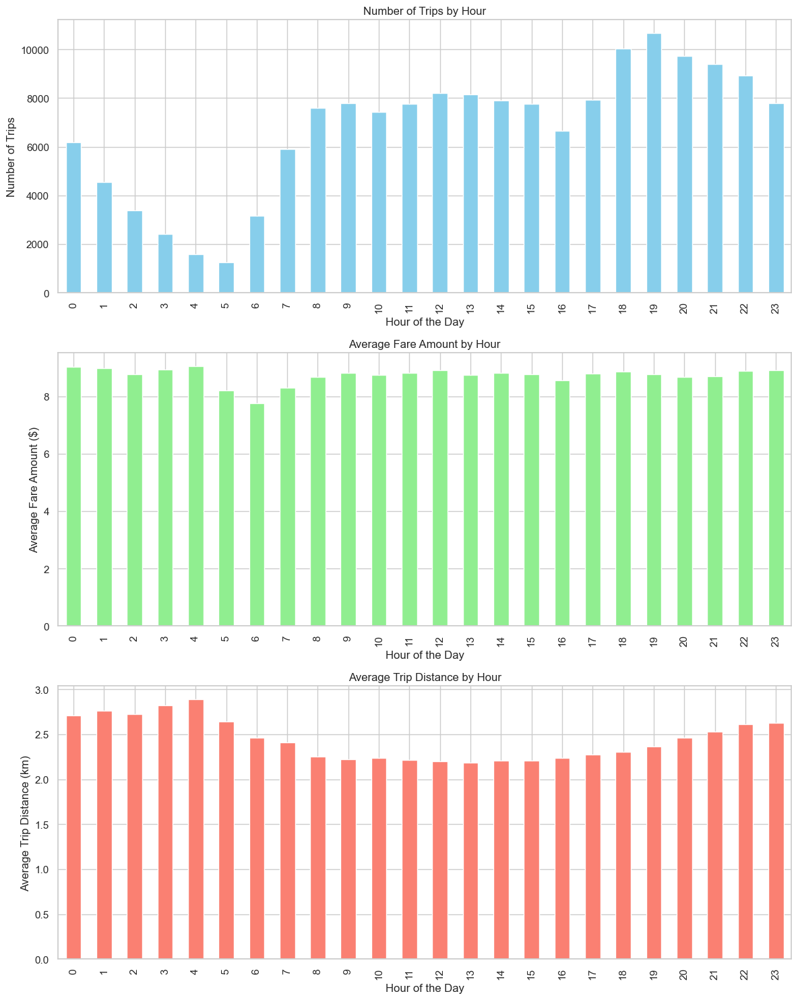

In [40]:
# Extracting the hour from the 'pickup_datetime' column for more detailed analysis
uber_data_preprocessed['pickup_hour'] = uber_data_preprocessed['pickup_datetime'].dt.hour

# Grouping by hour for count of trips
trip_count_by_hour = uber_data_preprocessed.groupby('pickup_hour').size()

# Grouping by hour for average fare and distance
average_fare_by_hour = uber_data_preprocessed.groupby('pickup_hour')['fare_amount'].mean()
average_distance_by_hour = uber_data_preprocessed.groupby('pickup_hour')['trip_distance_km'].mean()


# Plotting the results
fig, ax = plt.subplots(3, 1, figsize=(12, 15))

# Trip count by hour
trip_count_by_hour.plot(kind='bar', ax=ax[0], color='skyblue')
ax[0].set_title('Number of Trips by Hour')
ax[0].set_xlabel('Hour of the Day')
ax[0].set_ylabel('Number of Trips')

# Average fare by hour
average_fare_by_hour.plot(kind='bar', ax=ax[1], color='lightgreen')
ax[1].set_title('Average Fare Amount by Hour')
ax[1].set_xlabel('Hour of the Day')
ax[1].set_ylabel('Average Fare Amount ($)')

# Average trip distance by hour
average_distance_by_hour.plot(kind='bar', ax=ax[2], color='salmon')
ax[2].set_title('Average Trip Distance by Hour')
ax[2].set_xlabel('Hour of the Day')
ax[2].set_ylabel('Average Trip Distance (km)')

plt.tight_layout()
plt.savefig('distribution of hour.png')
plt.show()


The distribution plots provide the following insights:

1. Fare Amounts: The distribution of fare amounts appears to be right-skewed, with most fares clustering at the lower end. This suggests that shorter, less expensive trips are more common than longer, more expensive ones.

2. Trip Distances: Similar to fare amounts, the trip distance distribution is also right-skewed. Most trips are relatively short, with a few longer trips occurring less frequently.


These insights can inform the development of fare prediction models by highlighting the importance of focusing on the more common, shorter trips that constitute the bulk of the data. Moreover, the skewness in both distributions suggests that transforming these features, perhaps with a logarithmic function, might help linear models perform better by normalizing the distributions.

### Temporal trends

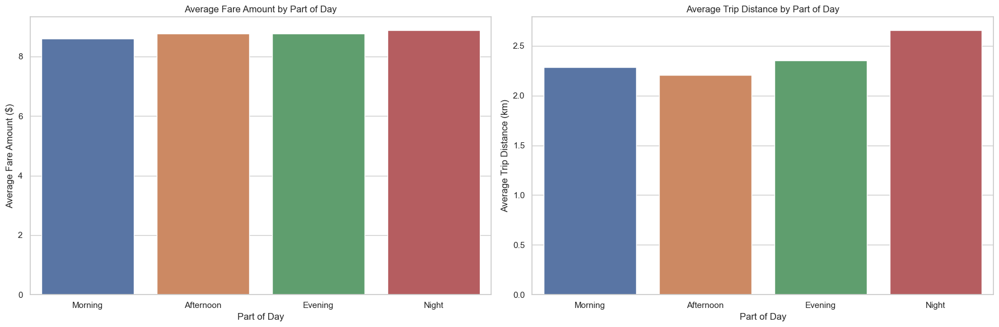

In [41]:

# Categorizing hours into parts of the day
def categorize_part_of_day(hour):
    if 5 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 17:
        return 'Afternoon'
    elif 17 <= hour < 21:
        return 'Evening'
    else:
        return 'Night'

uber_data_preprocessed['part_of_day'] = uber_data_preprocessed['pickup_hour'].apply(categorize_part_of_day)

# Calculating average fare amount and trip distance for each part of the day
average_fare_part_of_day = uber_data_preprocessed.groupby('part_of_day')['fare_amount'].mean().reset_index()
average_distance_part_of_day = uber_data_preprocessed.groupby('part_of_day')['trip_distance_km'].mean().reset_index()

# Plotting
fig, ax = plt.subplots(1, 2, figsize=(18, 6))

sns.barplot(x='part_of_day', y='fare_amount', data=average_fare_part_of_day, ax=ax[0], order=['Morning', 'Afternoon', 'Evening', 'Night'])
ax[0].set_title('Average Fare Amount by Part of Day')
ax[0].set_xlabel('Part of Day')
ax[0].set_ylabel('Average Fare Amount ($)')

sns.barplot(x='part_of_day', y='trip_distance_km', data=average_distance_part_of_day, ax=ax[1], order=['Morning', 'Afternoon', 'Evening', 'Night'])
ax[1].set_title('Average Trip Distance by Part of Day')
ax[1].set_xlabel('Part of Day')
ax[1].set_ylabel('Average Trip Distance (km)')

plt.tight_layout()
plt.show()


The analysis of average fare amounts and trip distances by part of the day reveals:

1. Morning and Afternoon : The fares and distances are relatively lower during these times, which could be due to shorter commutes or less traffic congestion.
2. Evening : There's a noticeable increase in both fare amount and trip distance, possibly due to higher demand, longer trips, or surge pricing in the evening.
3. Night: The pattern continues with higher average fares and distances, which might be attributed to a combination of factors such as limited public transport options during these hours and possibly longer trips.


### Day of the Week Analysis

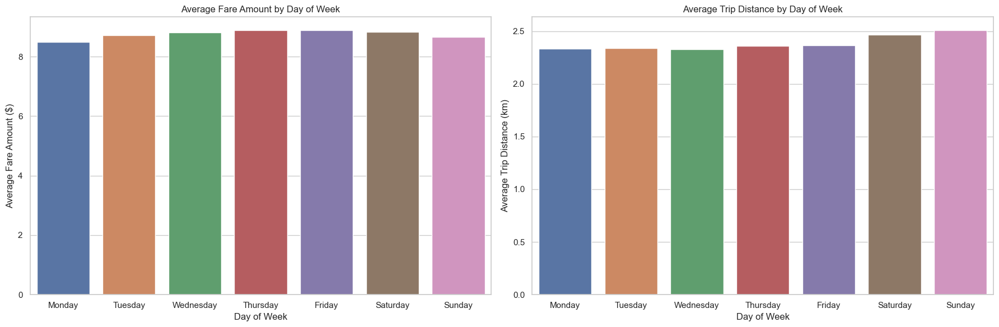

In [42]:
# Extracting day of the week (Monday=0, Sunday=6)
uber_data_preprocessed['day_of_week'] = uber_data_preprocessed['pickup_datetime'].dt.dayofweek

# Mapping day of week to actual names for readability
days = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
uber_data_preprocessed['day_of_week_name'] = uber_data_preprocessed['day_of_week'].map(days)

# Calculating average fare amount and trip distance for each day of the week
average_fare_day_of_week = uber_data_preprocessed.groupby('day_of_week_name')['fare_amount'].mean().reindex(days.values()).reset_index()
average_distance_day_of_week = uber_data_preprocessed.groupby('day_of_week_name')['trip_distance_km'].mean().reindex(days.values()).reset_index()

# Plotting the results
fig, ax = plt.subplots(1, 2, figsize=(18, 6))

sns.barplot(x='day_of_week_name', y='fare_amount', data=average_fare_day_of_week, ax=ax[0])
ax[0].set_title('Average Fare Amount by Day of Week')
ax[0].set_xlabel('Day of Week')
ax[0].set_ylabel('Average Fare Amount ($)')

sns.barplot(x='day_of_week_name', y='trip_distance_km', data=average_distance_day_of_week, ax=ax[1])
ax[1].set_title('Average Trip Distance by Day of Week')
ax[1].set_xlabel('Day of Week')
ax[1].set_ylabel('Average Trip Distance (km)')

plt.tight_layout()
plt.show()


The analysis of average fare amounts and trip distances by day of the week reveals:

1. Fare Amounts: The average fare amount seems relatively consistent across the week, with slight variations. This consistency suggests that the day of the week may not significantly influence fare amounts for the trips in our dataset.
2. Trip Distances: Similarly, the average trip distance remains fairly consistent across the days, indicating that the length of trips does not vary much from weekdays to weekends.

This consistency across days suggests that while there may be day-to-day fluctuations in demand, the overall trip characteristics (fare amount and distance) remain stable throughout the week.

### Seasonal Trends

/Users/andi/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/andi/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/andi/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/andi/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert in

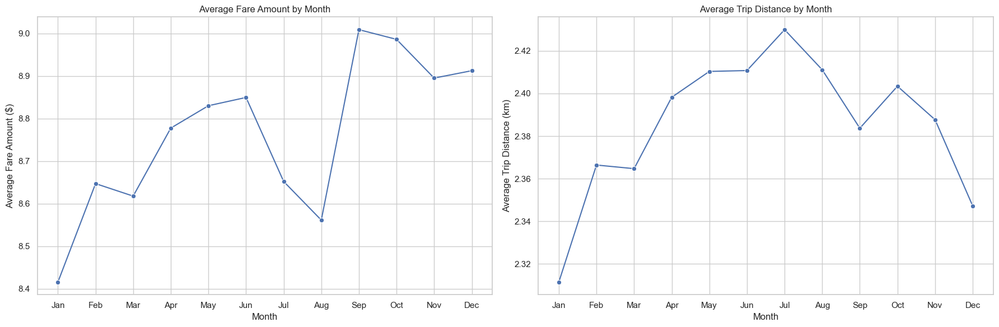

In [43]:
# Extracting month from the pickup datetime
uber_data_preprocessed['month'] = uber_data_preprocessed['pickup_datetime'].dt.month

# Calculating average fare amount and trip distance for each month
average_fare_month = uber_data_preprocessed.groupby('month')['fare_amount'].mean().reset_index()
average_distance_month = uber_data_preprocessed.groupby('month')['trip_distance_km'].mean().reset_index()

# Plotting the results
fig, ax = plt.subplots(1, 2, figsize=(18, 6))

sns.lineplot(x='month', y='fare_amount', data=average_fare_month, marker='o', ax=ax[0])
ax[0].set_title('Average Fare Amount by Month')
ax[0].set_xlabel('Month')
ax[0].set_ylabel('Average Fare Amount ($)')
ax[0].set_xticks(range(1, 13))
ax[0].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

sns.lineplot(x='month', y='trip_distance_km', data=average_distance_month, marker='o', ax=ax[1])
ax[1].set_title('Average Trip Distance by Month')
ax[1].set_xlabel('Month')
ax[1].set_ylabel('Average Trip Distance (km)')
ax[1].set_xticks(range(1, 13))
ax[1].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

plt.tight_layout()
plt.show()


The analysis of average fare amounts and trip distances by month reveals:

1. Fare Amounts: There's a slight seasonal trend visible in the fare amounts, with some variations across different months. However, these variations are not pronounced, indicating that while there may be some seasonal effects, they are not drastically affecting fare amounts.
2. Trip Distances: The trip distances show a similar pattern, with minor fluctuations throughout the year. This suggests that the length of trips remains relatively stable across different months, with no significant seasonal impact.

These insights suggest that while there might be slight seasonal variations, the overall impact on fare amounts and trip distances is minimal throughout the year.

### Passenger Count Impact

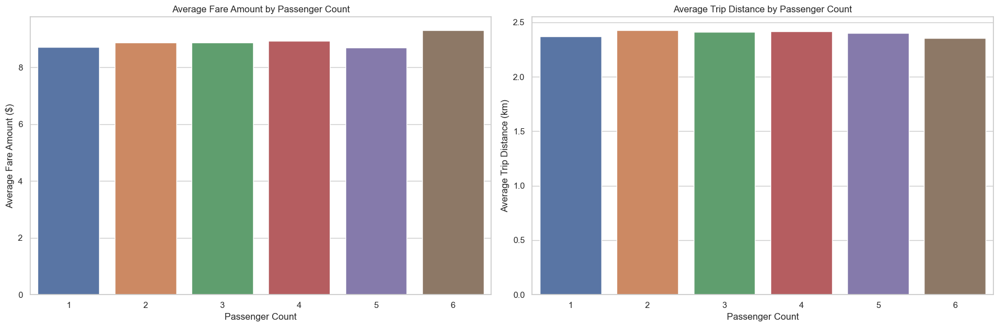

In [44]:
# Calculating average fare amount and trip distance for different passenger counts
average_fare_passenger_count = uber_data_preprocessed.groupby('passenger_count')['fare_amount'].mean().reset_index()
average_distance_passenger_count = uber_data_preprocessed.groupby('passenger_count')['trip_distance_km'].mean().reset_index()

# Plotting the results
fig, ax = plt.subplots(1, 2, figsize=(18, 6))

sns.barplot(x='passenger_count', y='fare_amount', data=average_fare_passenger_count, ax=ax[0])
ax[0].set_title('Average Fare Amount by Passenger Count')
ax[0].set_xlabel('Passenger Count')
ax[0].set_ylabel('Average Fare Amount ($)')

sns.barplot(x='passenger_count', y='trip_distance_km', data=average_distance_passenger_count, ax=ax[1])
ax[1].set_title('Average Trip Distance by Passenger Count')
ax[1].set_xlabel('Passenger Count')
ax[1].set_ylabel('Average Trip Distance (km)')

plt.tight_layout()
plt.show()


The analysis of average fare amounts and trip distances by passenger count reveals:

1. Fare Amounts: The average fare amount appears to vary slightly with different passenger counts, but there's no clear trend indicating that fare increases or decreases consistently with more passengers. This suggests that while the number of passengers might influence fare to some extent, it's not a dominant factor in determining fare amounts.
2. Trip Distances: Similar to fare amounts, the average trip distance shows slight variations across different passenger counts, but again, no consistent trend is observed. This indicates that trip distance is relatively independent of the number of passengers for the trips in our dataset.

These insights highlight that while passenger count may have some impact on fare amounts and trip distances, it's likely not a significant predictor on its own. Other factors, such as trip distance, time of day, and geographical locations, might play more substantial roles in determining fares and trip characteristics.

### Time of Day and Day of Week Combined Analysis

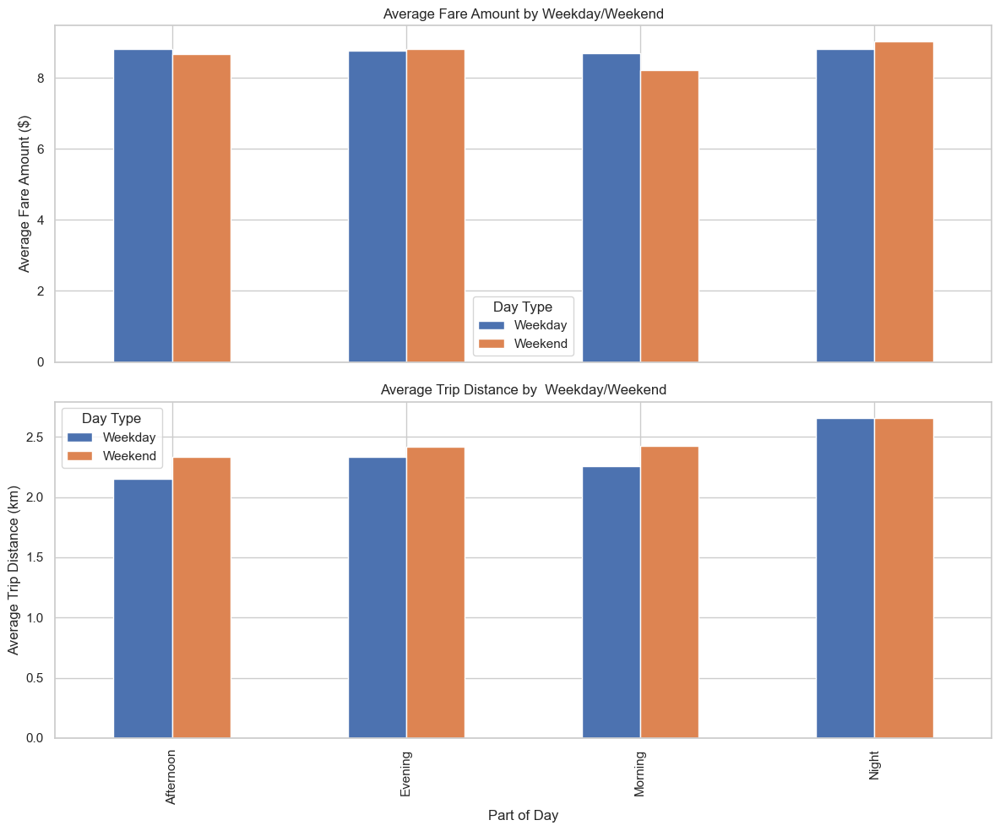

In [45]:
# Categorizing days into weekdays and weekends
uber_data_preprocessed['weekend'] = uber_data_preprocessed['day_of_week'].apply(lambda x: 'Weekend' if x >= 5 else 'Weekday')

# Grouping by part of day and weekend/weekday for average fare and distance
average_fare_time_week = uber_data_preprocessed.groupby(['part_of_day', 'weekend'])['fare_amount'].mean().unstack().reset_index()
average_distance_time_week = uber_data_preprocessed.groupby(['part_of_day', 'weekend'])['trip_distance_km'].mean().unstack().reset_index()

# Plotting
fig, ax = plt.subplots(2, 1, figsize=(12, 10))

average_fare_time_week.set_index('part_of_day').plot(kind='bar', ax=ax[0])
ax[0].set_title('Average Fare Amount by Weekday/Weekend')
ax[0].set_ylabel('Average Fare Amount ($)')
ax[0].set_xlabel('Part of Day')
ax[0].legend(title='Day Type')

average_distance_time_week.set_index('part_of_day').plot(kind='bar', ax=ax[1], sharex=ax[0])
ax[1].set_title('Average Trip Distance by  Weekday/Weekend')
ax[1].set_ylabel('Average Trip Distance (km)')
ax[1].set_xlabel('Part of Day')
ax[1].legend(title='Day Type')

plt.tight_layout()
plt.show()


The combined analysis of average fare amounts and trip distances by time of day and weekday/weekend reveals:

1. Fare Amounts: There are noticeable differences in average fare amounts between weekdays and weekends across different times of the day. Fares during the evenings and nights seem to be higher on weekends compared to weekdays, which might reflect higher demand or different trip patterns during these times.
2. Trip Distances: Similarly, trip distances show variations between weekdays and weekends, with the evening and night distances being longer on weekends. This could indicate that weekend trips tend to cover longer distances, possibly due to social activities or events.
These insights suggest that both the time of day and whether it's a weekday or weekend significantly influence fare amounts and trip distances. This nuanced understanding can be particularly useful for fare prediction models and for service planning, as it highlights the importance of considering the day of the week in addition to the time of day when analyzing trip data.

This analysis underscores the dynamic nature of trip patterns and fares, influenced by a complex interplay of factors including time, demand, and perhaps pricing strategies.

### Scatter Plot between Fare and Distance


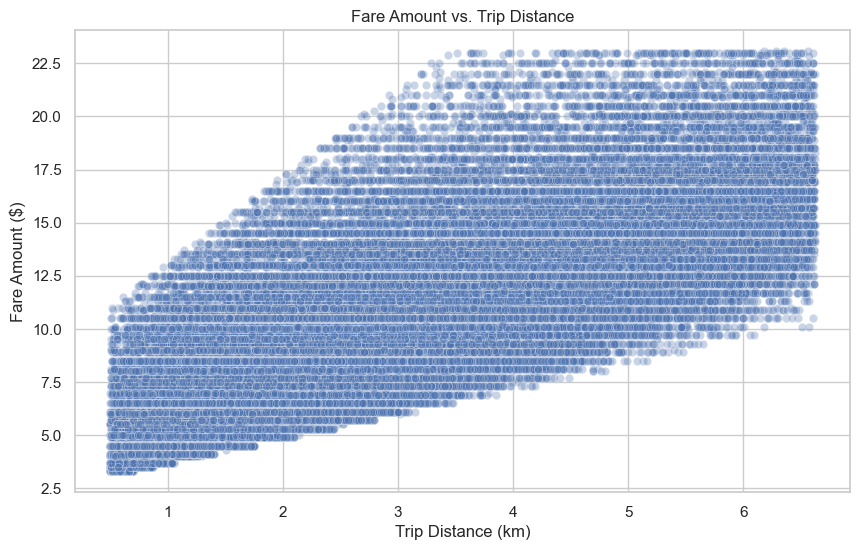

In [46]:
# Scatter plot of fare amount vs. trip distance
plt.figure(figsize=(10, 6))
sns.scatterplot(x='trip_distance_km', y='fare_amount', data=uber_data_preprocessed, alpha=0.3)

plt.title('Fare Amount vs. Trip Distance')
plt.xlabel('Trip Distance (km)')
plt.ylabel('Fare Amount ($)')

plt.show()


In [47]:
uber_data_preprocessed.info()

<class 'pandas.core.frame.DataFrame'>
Index: 162112 entries, 0 to 199999
Data columns (total 22 columns):
 #   Column             Non-Null Count   Dtype              
---  ------             --------------   -----              
 0   key                162112 non-null  object             
 1   fare_amount        162112 non-null  float64            
 2   pickup_datetime    162112 non-null  datetime64[ns, UTC]
 3   pickup_longitude   162112 non-null  float64            
 4   pickup_latitude    162112 non-null  float64            
 5   dropoff_longitude  162112 non-null  float64            
 6   dropoff_latitude   162112 non-null  float64            
 7   passenger_count    162112 non-null  int64              
 8   key_id             162112 non-null  object             
 9   trip_distance_km   162112 non-null  float64            
 10  pickup_date        162112 non-null  object             
 11  pickup_time        162112 non-null  object             
 12  pickup_country     162112 non-null 

In [48]:
# uber_data_preprocessed.to_csv('cleaned_uber.csv')

In [49]:
cluster_analysis = uber_data_preprocessed.copy()
cor_anova_testing = uber_data_preprocessed.copy()
feature_testing = uber_data_preprocessed.copy()

## Feature Selection Clustering

In [50]:
clustering_data = feature_testing[['pickup_city','dropoff_city','part_of_day','weekend',
                                        'day_of_week','month','pickup_hour','passenger_count','trip_distance_km','fare_amount']].copy()

# Encode categorical variables using label encoding and one-hot encoding
label_encoder = LabelEncoder()
clustering_data = pd.get_dummies(clustering_data, columns=['pickup_city', 'dropoff_city', 'part_of_day','weekend'])

# Standardize numerical features (day_of_week, month, pickup_hour, passenger_count, trip_distance_km, fare_amount )
scaler = StandardScaler()
clustering_data[['day_of_week', 'month', 'pickup_hour','passenger_count','trip_distance_km','fare_amount']] = scaler.fit_transform(clustering_data[['day_of_week', 'month', 'pickup_hour','passenger_count','trip_distance_km','fare_amount']])


# Perform PCA to reduce dimensionality to 2 features
pca = PCA(n_components=2)
data_pca = pca.fit_transform(clustering_data)


# Create a DataFrame for PCA results
pca_df = pd.DataFrame(data_pca, columns=['PCA1', 'PCA2'])

# Save the pca_df to a CSV file
pca_df.to_csv('PCA_data.csv', index=False)

                      

## K-Means Clustering

/Users/andi/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/andi/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/andi/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/andi/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to

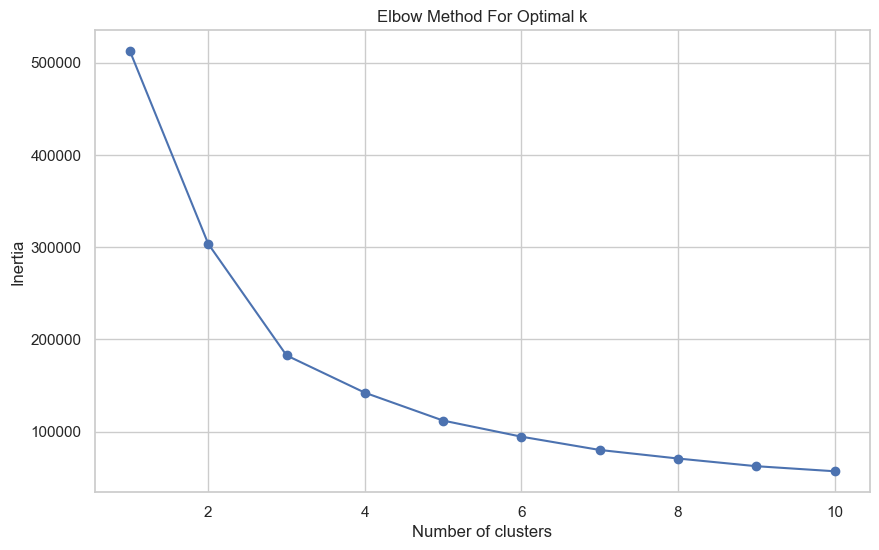

In [51]:

# Determining the optimal number of clusters using the Elbow Method
inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(data_pca)
    inertia.append(kmeans.inertia_)

# Plotting the Elbow Method

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method For Optimal k')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.savefig('inertia plot.png')
plt.show()


In [52]:
inertia

[512502.7553360231,
 303656.91967971274,
 182722.92383725333,
 142302.4010703562,
 112060.92929165665,
 94606.5961653864,
 80197.22874194005,
 70924.45687620553,
 62594.33894578005,
 57112.511174653235]

In [53]:

# Applying K-means clustering with the chosen number (4) of clusters
kmeans = KMeans(n_clusters=5, random_state=42)
cluster_labels = kmeans.fit_predict(data_pca)
centroids = kmeans.cluster_centers_

clustering_data['cluster'] = kmeans.fit_predict(data_pca)



/Users/andi/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/andi/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [54]:

def visualize_clusters_2d(data_pca, cluster_labels, centroids=None):
    # Create a DataFrame from the PCA data
    column_names = ['PCA_Component_1', 'PCA_Component_2']
    clustering_data = pd.DataFrame(data=data_pca, columns=column_names)
    clustering_data['cluster'] = cluster_labels
    
    # Create a 2D scatter plot
    fig = px.scatter(clustering_data, x='PCA_Component_1', y='PCA_Component_2',
                     color='cluster', opacity=0.8, symbol='cluster', 
                     title='2D Scatter Plot of PCA Components with Cluster Coloring')
    
    if centroids is not None:
        # Add centroids to the plot
        centroid_df = pd.DataFrame(data=centroids, columns=['PCA_Component_1', 'PCA_Component_2'])
        centroid_df['cluster'] = range(len(centroids))
        fig.add_trace(px.scatter(centroid_df, x='PCA_Component_1', y='PCA_Component_2',
                                 color='cluster', symbol='cluster').data[0])
        fig.data[-1].name = 'Centroids'  # Rename the trace to "Centroids"
        fig.data[-1].marker.size = 10  # Increase the marker size for centroids
        fig.data[-1].marker.symbol = 'x'  # Change the marker symbol for centroids
    
    fig.update_layout(xaxis_title='PCA Component 1',
                      yaxis_title='PCA Component 2',
                      legend_title='Cluster')
    fig.show()


In [55]:
visualize_clusters_2d(data_pca, cluster_labels,centroids)

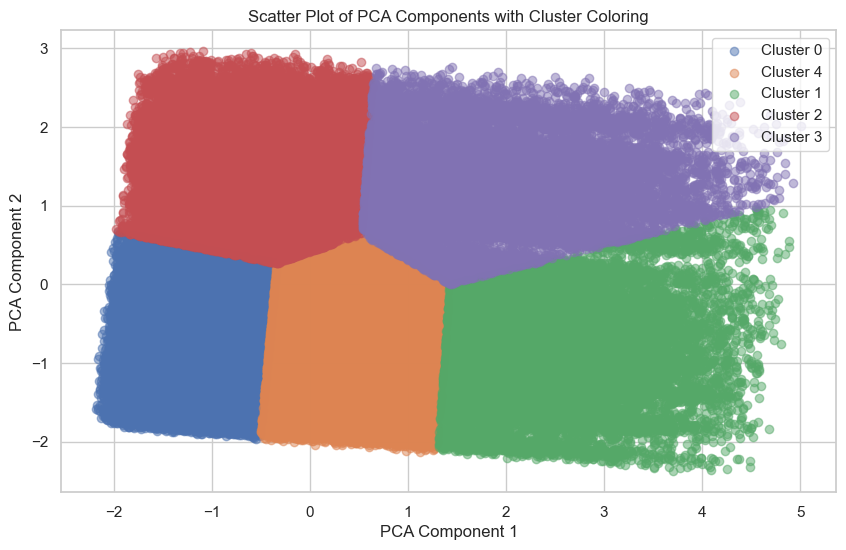

In [56]:


# Assuming 'data_pca' is your PCA result and 'cluster_labels' contains the cluster assignment for each point
column_names = ['PCA_Component_1', 'PCA_Component_2']
clustering_data = pd.DataFrame(data=data_pca, columns=column_names)
clustering_data['Cluster'] = cluster_labels  # Add the cluster labels to your DataFrame

# Plot using matplotlib with colors for each cluster
plt.figure(figsize=(10, 6))
for cluster in clustering_data['Cluster'].unique():
    # Filter the data for each cluster
    cluster_data = clustering_data[clustering_data['Cluster'] == cluster]
    
    # Scatter plot for each cluster
    plt.scatter(cluster_data['PCA_Component_1'], cluster_data['PCA_Component_2'], alpha=0.5, label=f'Cluster {cluster}')

plt.title('Scatter Plot of PCA Components with Cluster Coloring')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()
plt.savefig('clustering pca.png')
plt.show()


In [57]:
clustering_data.head()

,PCA_Component_1,PCA_Component_2,Cluster
0,-0.63993,-0.52168,0
1,-0.16772,-0.20627,4
2,1.94831,-2.02826,1
3,-0.94371,0.71538,2
4,2.43970,-0.42920,1


In [58]:
clustering_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 162112 entries, 0 to 162111
Data columns (total 3 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   PCA_Component_1  162112 non-null  float64
 1   PCA_Component_2  162112 non-null  float64
 2   Cluster          162112 non-null  int32  
dtypes: float64(2), int32(1)
memory usage: 3.1 MB


In [59]:
from sklearn.metrics import davies_bouldin_score

# Calculate the Davies-Bouldin score
score = davies_bouldin_score(clustering_data, cluster_labels)
print("Davies-Bouldin Score:", score)


Davies-Bouldin Score: 0.6077370893371586


In [60]:
from sklearn.metrics import calinski_harabasz_score

# Calculate the Calinski-Harabasz score
score = calinski_harabasz_score(clustering_data, cluster_labels)
print("Calinski-Harabasz Score:", score)


Calinski-Harabasz Score: 286048.5379736858


In [61]:
# silhouette_avg = silhouette_score(data_pca, cluster_labels)
# print("Silhouette Score:", silhouette_avg)

In [62]:
silhouette_avg = silhouette_score(clustering_data, cluster_labels)
print("Silhouette Score:", silhouette_avg)

Silhouette Score: 0.6234600458367195


The silhouette score is a measure to evaluate the quality of clusters created by a clustering algorithm. It ranges from -1 to 1, where a high value indicates that the clusters are well-separated and cohesive. Scores above 0.5 suggest good clustering, below 0.25 indicate poor clustering, and between 0.25 and 0.5 denote fair clustering.

### Cluster Interpretation

In [63]:
cluster_analysis['cluster'] = cluster_labels

In [64]:
cluster_analysis.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,key_id,trip_distance_km,pickup_date,pickup_time,pickup_country,pickup_city,dropoff_country,dropoff_city,pickup_hour,part_of_day,day_of_week,day_of_week_name,month,weekend,cluster
0,2015-05-07 19:52:06.0000003,7.50000,2015-05-07 19:52:06+00:00,-73.99982,40.73835,-73.99951,40.72322,1,0000003,1.68332,2015-05-07,19:52:06,United States,Gramercy Park,United States,Chinatown,19,Evening,3,Thursday,5,Weekday,0
1,2009-07-17 20:04:56.0000002,7.70000,2009-07-17 20:04:56+00:00,-73.99435,40.72823,-73.99471,40.75032,1,0000002,2.45759,2009-07-17,20:04:56,United States,East Village,United States,Hell's Kitchen,20,Evening,4,Friday,7,Weekday,4
2,2009-08-24 21:45:00.00000061,12.90000,2009-08-24 21:45:00+00:00,-74.00504,40.74077,-73.96256,40.77265,1,00000061,5.03638,2009-08-24,21:45:00,United States,Gramercy Park,United States,Manhattan,21,Night,0,Monday,8,Weekday,1
3,2009-06-26 08:22:21.0000001,5.30000,2009-06-26 08:22:21+00:00,-73.97612,40.79084,-73.96532,40.80335,3,0000001,1.66168,2009-06-26,08:22:21,United States,Manhattan,United States,Morningside Heights,8,Morning,4,Friday,6,Weekday,2
4,2014-08-28 17:47:00.000000188,16.00000,2014-08-28 17:47:00+00:00,-73.92502,40.74408,-73.97308,40.76125,5,000000188,4.47545,2014-08-28,17:47:00,United States,Sunnyside,United States,Hell's Kitchen,17,Evening,3,Thursday,8,Weekday,1


In [65]:
cluster_analysis.info()

<class 'pandas.core.frame.DataFrame'>
Index: 162112 entries, 0 to 199999
Data columns (total 23 columns):
 #   Column             Non-Null Count   Dtype              
---  ------             --------------   -----              
 0   key                162112 non-null  object             
 1   fare_amount        162112 non-null  float64            
 2   pickup_datetime    162112 non-null  datetime64[ns, UTC]
 3   pickup_longitude   162112 non-null  float64            
 4   pickup_latitude    162112 non-null  float64            
 5   dropoff_longitude  162112 non-null  float64            
 6   dropoff_latitude   162112 non-null  float64            
 7   passenger_count    162112 non-null  int64              
 8   key_id             162112 non-null  object             
 9   trip_distance_km   162112 non-null  float64            
 10  pickup_date        162112 non-null  object             
 11  pickup_time        162112 non-null  object             
 12  pickup_country     162112 non-null 

In [66]:
cluster_analysis.describe()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,trip_distance_km,pickup_hour,day_of_week,month,cluster
count,162112.00000,162112.00000,162112.00000,162112.00000,162112.00000,162112.00000,162112.00000,162112.00000,162112.00000,162112.00000,162112.00000
mean,8.75904,-73.98070,40.75224,-73.97938,40.75227,1.68769,2.38472,13.60534,3.04433,6.26290,1.80520
std,3.71633,0.01966,0.02286,0.02075,0.02450,1.30382,1.42753,6.44052,1.94040,3.44733,1.55205
min,3.30000,-74.22510,40.51090,-74.22657,40.51966,1.00000,0.50005,0.00000,0.00000,1.00000,0.00000
25%,6.00000,-73.99256,40.73762,-73.99196,40.73744,1.00000,1.26580,9.00000,1.00000,3.00000,0.00000
50%,8.00000,-73.98261,40.75320,-73.98161,40.75373,1.00000,2.00347,14.00000,3.00000,6.00000,2.00000
75%,10.90000,-73.97087,40.76664,-73.96932,40.76714,2.00000,3.17331,19.00000,5.00000,9.00000,3.00000
max,23.07000,-73.70274,40.89257,-73.70065,40.89899,6.00000,6.62226,23.00000,6.00000,12.00000,4.00000


In [67]:
# Cluster Descriptive Statistics
cluster_stats = cluster_analysis[['day_of_week','pickup_hour','passenger_count','trip_distance_km','fare_amount','cluster']].groupby('cluster').describe().T
cluster_stats.style.format("{:.0f}")

1. Cluster 0:
    - Trips occur mostly early in the week (mean day_of_week around 2, which could be Tuesday if 0 is Sunday).
    - The average pickup hour is mid-afternoon (15, which is 3 PM).
    - Most passengers ride solo or with one other person (50% have 1 passenger).
    - Trip distances are short (mean of 1 km, with a max of 3 km).
    - Fares are low (mean of $6).
2. Cluster 1:
    - Also active early in the week but extends to mid-week (with days ranging from 0 to 6).
    - Pickup times are widely distributed throughout the day (mean at 15 but with a broader spread).
    - Passenger count is similar to Cluster 0.
    - This cluster represents longer trips (mean distance of 5 km, with up to 7 km).
    - Correspondingly, fares are higher (mean of $15).
3. Cluster 2:
    - Activity peaks later in the week (mean day_of_week is 5, possibly Friday).
    - Pickups are around noon (mean pickup_hour is 12).
    - Passenger counts are similar to the other clusters.
    - Trip distances are moderate (mean of 2 km).
    - Fares are slightly higher than Cluster 0 but lower than Cluster 1 (mean of $7).
4. Cluster 3:
    - Like Cluster 2, activity is later in the week (mean day_of_week is 5).
    - Pickup times tend to be earlier (mean of 11, suggesting late morning to noon).
    - Trips are somewhat longer (mean distance of 4 km).
    - Fares are higher, similar to those in Cluster 1 (mean of $13).
5. Cluster 4:
    - Activity spans from early to the middle of the week (0-4 days).
    - Pickups are in the mid-afternoon (mean hour is 15).
    - Trip distances are longer than Cluster 0 but shorter than Clusters 1 and 3 (mean of 3 km).
    - Fares are in the mid-range (mean of $10).

- Overall Interpretation:
    - Cluster 0 could be representing short, local trips that are common early in the week.
    - Cluster 1 seems to cater to longer trips that happen throughout the day, potentially for business or travel to farther destinations.
    - Clusters 2 and 3 show a focus on trips later in the week, with Cluster 2 being around midday and Cluster 3 covering late mornings; these might be associated with leisure or errands leading up to the weekend.
    - Cluster 4 has trips that are moderately long and might be capturing a mix of purposes, with afternoons being a peak time for pickups early in the week.


In Summary :
1. Cluster 0 - "Early Week Short Hops": Short distances and low fares, with trips concentrated early in the week, possibly reflecting routine local errands or commutes.
2. Cluster 1 - "All-Week Long Hauls": With trips distributed throughout the week, longer distances, and higher fares, this cluster may represent a mix of business travel and personal longer-distance journeys across the city.
3. Cluster 2 - "Weekend Midday Outings": Activity peaks on Fridays, with midday pickups and moderate fares and distances, suggesting outings such as lunchtime activities, shopping, or early starts to weekend plans.
4. Cluster 3 - "Pre-Weekend Longer Rides": Similar to Cluster 2 but with earlier pickups and longer distances, indicating possibly extended activities or getaways in preparation for the weekend.
5. Cluster 4 - "Versatile Afternoon Commuters": A versatile cluster with moderate trip lengths and fares, active throughout the early to mid-week afternoons, could indicate a mix of commuting and general travel for various purposes.

These names aim to capture the essence of each cluster's trip patterns, providing a quick reference to the habits and likely needs of each customer segment.


In [68]:
# Replace the intial cluster names into the determined cluster names

# Create a dictionary to map the initial cluster names to the determined cluster names
cluster_mapping = {
    0: "Early Week Short Travellers",
    1: "All-Week Long Hauls",
    2: "Weekend Midday Outings",
    3: "Pre-Weekend Longer Rides",
    4: "Versatile Afternoon Commuters"
}

# Replace the values in the 'cluster' column with the determined cluster names
cluster_analysis['cluster'] = cluster_analysis['cluster'].map(cluster_mapping)

In [69]:
cluster_analysis.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,key_id,trip_distance_km,pickup_date,pickup_time,pickup_country,pickup_city,dropoff_country,dropoff_city,pickup_hour,part_of_day,day_of_week,day_of_week_name,month,weekend,cluster
0,2015-05-07 19:52:06.0000003,7.50000,2015-05-07 19:52:06+00:00,-73.99982,40.73835,-73.99951,40.72322,1,0000003,1.68332,2015-05-07,19:52:06,United States,Gramercy Park,United States,Chinatown,19,Evening,3,Thursday,5,Weekday,Early Week Short Travellers
1,2009-07-17 20:04:56.0000002,7.70000,2009-07-17 20:04:56+00:00,-73.99435,40.72823,-73.99471,40.75032,1,0000002,2.45759,2009-07-17,20:04:56,United States,East Village,United States,Hell's Kitchen,20,Evening,4,Friday,7,Weekday,Versatile Afternoon Commuters
2,2009-08-24 21:45:00.00000061,12.90000,2009-08-24 21:45:00+00:00,-74.00504,40.74077,-73.96256,40.77265,1,00000061,5.03638,2009-08-24,21:45:00,United States,Gramercy Park,United States,Manhattan,21,Night,0,Monday,8,Weekday,All-Week Long Hauls
3,2009-06-26 08:22:21.0000001,5.30000,2009-06-26 08:22:21+00:00,-73.97612,40.79084,-73.96532,40.80335,3,0000001,1.66168,2009-06-26,08:22:21,United States,Manhattan,United States,Morningside Heights,8,Morning,4,Friday,6,Weekday,Weekend Midday Outings
4,2014-08-28 17:47:00.000000188,16.00000,2014-08-28 17:47:00+00:00,-73.92502,40.74408,-73.97308,40.76125,5,000000188,4.47545,2014-08-28,17:47:00,United States,Sunnyside,United States,Hell's Kitchen,17,Evening,3,Thursday,8,Weekday,All-Week Long Hauls


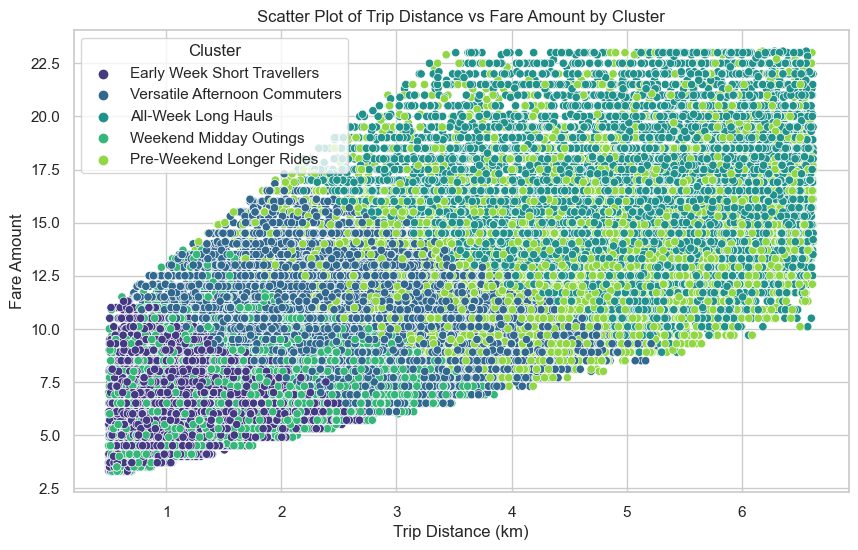

In [70]:
# Create a scatter plot for 'trip_distance_km' vs 'fare_amount' colored by cluster
plt.figure(figsize=(10, 6))
sns.scatterplot(data=cluster_analysis, x='trip_distance_km', y='fare_amount', hue='cluster', palette='viridis')
plt.title('Scatter Plot of Trip Distance vs Fare Amount by Cluster')
plt.xlabel('Trip Distance (km)')
plt.ylabel('Fare Amount')
plt.legend(title='Cluster')
# plt.savefig('scatter plot with cluster.png')
plt.show()

In [71]:
# # Create boxplots for 'trip_distance_km' and 'fare_amount' for each cluster
# fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# sns.boxplot(x='cluster', y='trip_distance_km', data=cluster_analysis, ax=axs[0])
# axs[0].set_title('Box Plot of Trip Distance by Cluster')
# axs[0].set_xlabel('Cluster')
# axs[0].set_ylabel('Trip Distance (km)')

# sns.boxplot(x='cluster', y='fare_amount', data=cluster_analysis, ax=axs[1])
# axs[1].set_title('Box Plot of Fare Amount by Cluster')
# axs[1].set_xlabel('Cluster')
# axs[1].set_ylabel('Fare Amount')

# plt.tight_layout()
# plt.show()

In [72]:

cluster_analysis.to_csv('cluster1.csv', index=False)


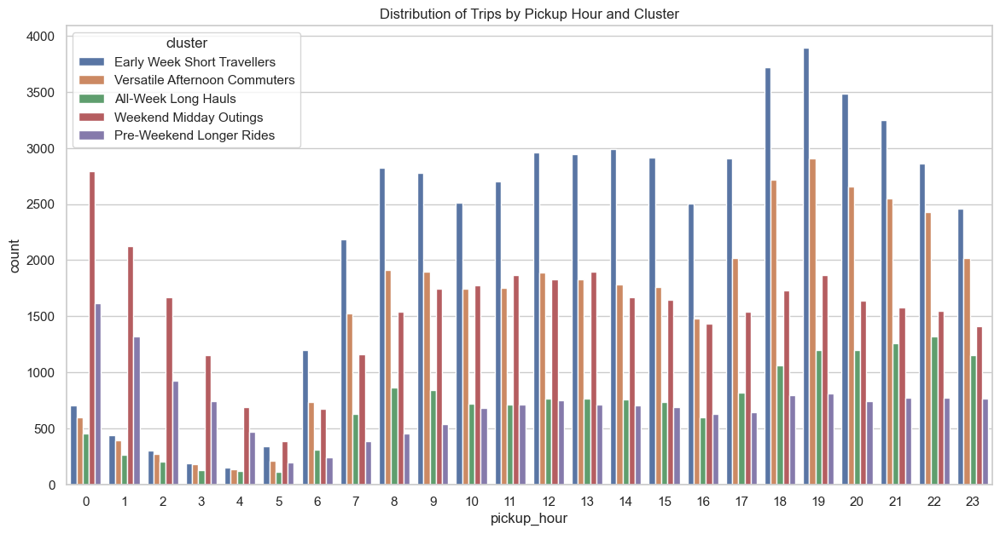

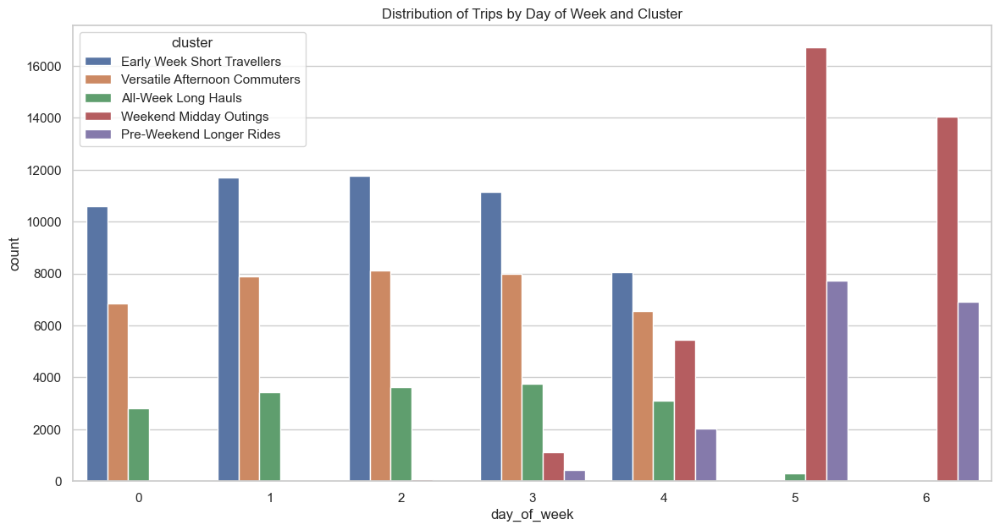

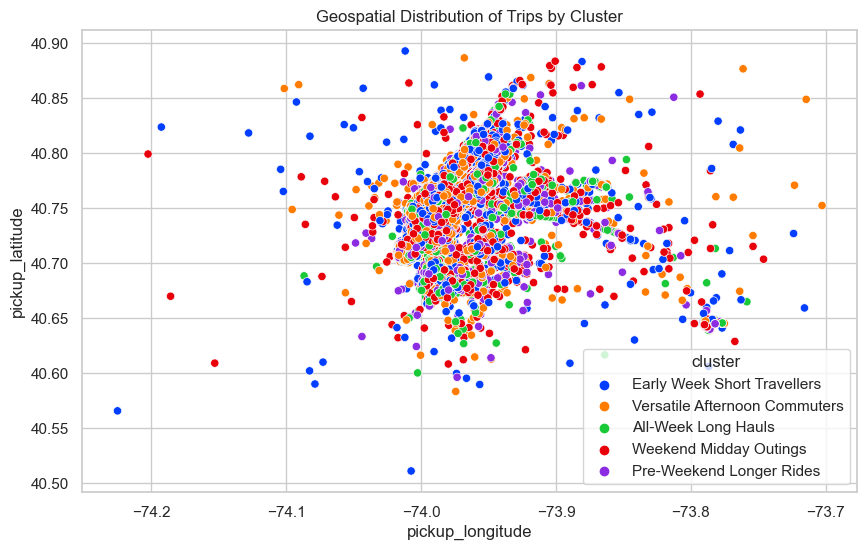

In [73]:
sns.set(style="whitegrid")

# 1. Temporal Patterns Analysis
# Plot the distribution of trips across the hours of the day for each cluster
plt.figure(figsize=(14, 7))
sns.countplot(data=cluster_analysis, x='pickup_hour', hue='cluster')
plt.title('Distribution of Trips by Pickup Hour and Cluster')
plt.show()

# Plot the distribution of trips across the days of the week for each cluster
plt.figure(figsize=(14, 7))
sns.countplot(data=cluster_analysis, x='day_of_week', hue='cluster')
plt.title('Distribution of Trips by Day of Week and Cluster')
plt.show()

# 2. Geospatial Analysis
# Assuming you have 'pickup_latitude' and 'pickup_longitude' in your dataset
plt.figure(figsize=(10, 6))
sns.scatterplot(data=cluster_analysis, x='pickup_longitude', y='pickup_latitude', hue='cluster', palette='bright')
plt.title('Geospatial Distribution of Trips by Cluster')
plt.show()


In [74]:
# Group by cluster and drop-off location and count the number of trips
popular_destinations = cluster_analysis.groupby(['cluster', 'dropoff_latitude', 'dropoff_longitude']) \
                                       .size() \
                                       .reset_index(name='trip_count')

# Sort the counts within each cluster to find the most popular destinations
popular_destinations = popular_destinations.sort_values(['cluster', 'trip_count'], ascending=[True, False])

# Get the top N popular destinations for each cluster
top_n = 5
popular_destinations_by_cluster = popular_destinations.groupby('cluster').head(top_n)

print(popular_destinations_by_cluster)


                              cluster  dropoff_latitude  dropoff_longitude  \
0                 All-Week Long Hauls          40.55916          -73.87740   
1                 All-Week Long Hauls          40.59553          -73.75123   
2                 All-Week Long Hauls          40.60945          -73.95664   
3                 All-Week Long Hauls          40.61590          -73.99023   
4                 All-Week Long Hauls          40.61968          -73.73241   
23894     Early Week Short Travellers          40.73136          -73.99173   
37884     Early Week Short Travellers          40.75024          -73.99488   
38603     Early Week Short Travellers          40.75079          -73.99088   
59317     Early Week Short Travellers          40.77111          -73.96372   
63989     Early Week Short Travellers          40.77871          -73.97979   
70238        Pre-Weekend Longer Rides          40.58666          -73.93023   
70239        Pre-Weekend Longer Rides          40.60584         

In [75]:
# Assuming your DataFrame is named cluster_analysis and there is a 'dropoff_location' column

# Group the data by 'cluster' and 'dropoff_location' and count the occurrences
popular_destinations = cluster_analysis.groupby(['cluster', 'pickup_city']) \
                                       .size() \
                                       .reset_index(name='count')

# Sort the counts within each cluster in descending order
popular_destinations_pickup = popular_destinations.sort_values(by=['cluster', 'count'], ascending=[True, False])

# Select the top N destinations for each cluster
top_n_destinations = popular_destinations_pickup.groupby('cluster').head(5)

# Display the top N destinations for each cluster
top_n_destinations


,cluster,pickup_city,count
26,All-Week Long Hauls,Hell's Kitchen,3704
22,All-Week Long Hauls,Gramercy Park,3482
35,All-Week Long Hauls,Manhattan,2779
14,All-Week Long Hauls,East Village,1404
40,All-Week Long Hauls,New York City,1178
94,Early Week Short Travellers,Hell's Kitchen,15200
89,Early Week Short Travellers,Gramercy Park,14520
111,Early Week Short Travellers,Manhattan,11198
81,Early Week Short Travellers,East Village,3785
119,Early Week Short Travellers,New York City,1836


In [76]:
# Assuming your DataFrame is named cluster_analysis and there is a 'dropoff_location' column

# Group the data by 'cluster' and 'dropoff_location' and count the occurrences
popular_destinations = cluster_analysis.groupby(['cluster', 'dropoff_city']) \
                                       .size() \
                                       .reset_index(name='count')

# Sort the counts within each cluster in descending order
popular_destinations_sorted = popular_destinations.sort_values(by=['cluster', 'count'], ascending=[True, False])

# Select the top N destinations for each cluster
top_n_destinations = popular_destinations_sorted.groupby('cluster').head(5)

# Display the top N destinations for each cluster
top_n_destinations


,cluster,dropoff_city,count
35,All-Week Long Hauls,Hell's Kitchen,3232
30,All-Week Long Hauls,Gramercy Park,2636
49,All-Week Long Hauls,Manhattan,2448
58,All-Week Long Hauls,New York City,1106
23,All-Week Long Hauls,Financial District,1087
121,Early Week Short Travellers,Hell's Kitchen,15381
115,Early Week Short Travellers,Gramercy Park,14253
136,Early Week Short Travellers,Manhattan,11036
106,Early Week Short Travellers,East Village,3897
148,Early Week Short Travellers,New York City,1766


In [77]:
# Define fixed costs
cost_per_km = 1.09  # This is a made-up number for illustration purposes
base_fare = 2.5  # Another illustrative assumption
cost_per_minute = 0.35
time_in_car =  cluster_analysis['trip_distance_km']/cost_per_minute

# Add a new column for total cost for each trip
cluster_analysis['cost'] = (cluster_analysis['trip_distance_km'] * cost_per_km ) + (time_in_car * cost_per_minute) + base_fare

# Calculate the profit for each trip by subtracting the cost from the fare
cluster_analysis['profit'] = cluster_analysis['fare_amount'] - cluster_analysis['cost']

# Now, perform the cost analysis per cluster
cost_analysis_by_cluster = cluster_analysis.groupby('cluster').agg(
    total_trips=('cluster', 'size'),
    total_distance=('trip_distance_km', 'sum'),
    total_fares=('fare_amount', 'sum'),
    total_costs=('cost', 'sum'),
    total_profits=('profit', 'sum')
).reset_index()

# Calculate the average cost, fare, and profit per trip for each cluster
cost_analysis_by_cluster['average_cost_per_trip'] = cost_analysis_by_cluster['total_costs'] / cost_analysis_by_cluster['total_trips']
cost_analysis_by_cluster['average_fare_per_trip'] = cost_analysis_by_cluster['total_fares'] / cost_analysis_by_cluster['total_trips']
cost_analysis_by_cluster['average_profit_per_trip'] = cost_analysis_by_cluster['total_profits'] / cost_analysis_by_cluster['total_trips']

cost_analysis_by_cluster


,cluster,total_trips,total_distance,total_fares,total_costs,total_profits,average_cost_per_trip,average_fare_per_trip,average_profit_per_trip
0,All-Week Long Hauls,17006,83233.18589,261881.81000,216472.35851,45409.45149,12.72918,15.39938,2.67020
1,Early Week Short Travellers,53237,68621.79677,319209.95000,276512.05525,42697.89475,5.19398,5.99602,0.80203
2,Pre-Weekend Longer Rides,17103,71070.23990,217623.82000,191294.30138,26329.51862,11.18484,12.72431,1.53947
3,Versatile Afternoon Commuters,37399,102288.54187,371326.30000,307280.55251,64045.74749,8.21628,9.92878,1.71250
4,Weekend Midday Outings,37367,61377.49822,249904.23000,221696.47129,28207.75871,5.93295,6.68783,0.75488


In [78]:
cost_analysis_by_cluster.to_csv('cost_analysis_by_cluster.csv')

In [79]:
cluster_analysis.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,key_id,trip_distance_km,pickup_date,pickup_time,pickup_country,pickup_city,dropoff_country,dropoff_city,pickup_hour,part_of_day,day_of_week,day_of_week_name,month,weekend,cluster,cost,profit
0,2015-05-07 19:52:06.0000003,7.50000,2015-05-07 19:52:06+00:00,-73.99982,40.73835,-73.99951,40.72322,1,0000003,1.68332,2015-05-07,19:52:06,United States,Gramercy Park,United States,Chinatown,19,Evening,3,Thursday,5,Weekday,Early Week Short Travellers,6.01814,1.48186
1,2009-07-17 20:04:56.0000002,7.70000,2009-07-17 20:04:56+00:00,-73.99435,40.72823,-73.99471,40.75032,1,0000002,2.45759,2009-07-17,20:04:56,United States,East Village,United States,Hell's Kitchen,20,Evening,4,Friday,7,Weekday,Versatile Afternoon Commuters,7.63636,0.06364
2,2009-08-24 21:45:00.00000061,12.90000,2009-08-24 21:45:00+00:00,-74.00504,40.74077,-73.96256,40.77265,1,00000061,5.03638,2009-08-24,21:45:00,United States,Gramercy Park,United States,Manhattan,21,Night,0,Monday,8,Weekday,All-Week Long Hauls,13.02603,-0.12603
3,2009-06-26 08:22:21.0000001,5.30000,2009-06-26 08:22:21+00:00,-73.97612,40.79084,-73.96532,40.80335,3,0000001,1.66168,2009-06-26,08:22:21,United States,Manhattan,United States,Morningside Heights,8,Morning,4,Friday,6,Weekday,Weekend Midday Outings,5.97292,-0.67292
4,2014-08-28 17:47:00.000000188,16.00000,2014-08-28 17:47:00+00:00,-73.92502,40.74408,-73.97308,40.76125,5,000000188,4.47545,2014-08-28,17:47:00,United States,Sunnyside,United States,Hell's Kitchen,17,Evening,3,Thursday,8,Weekday,All-Week Long Hauls,11.85369,4.14631


In [80]:
cost_analysis_by_cluster.head()

,cluster,total_trips,total_distance,total_fares,total_costs,total_profits,average_cost_per_trip,average_fare_per_trip,average_profit_per_trip
0,All-Week Long Hauls,17006,83233.18589,261881.81000,216472.35851,45409.45149,12.72918,15.39938,2.67020
1,Early Week Short Travellers,53237,68621.79677,319209.95000,276512.05525,42697.89475,5.19398,5.99602,0.80203
2,Pre-Weekend Longer Rides,17103,71070.23990,217623.82000,191294.30138,26329.51862,11.18484,12.72431,1.53947
3,Versatile Afternoon Commuters,37399,102288.54187,371326.30000,307280.55251,64045.74749,8.21628,9.92878,1.71250
4,Weekend Midday Outings,37367,61377.49822,249904.23000,221696.47129,28207.75871,5.93295,6.68783,0.75488


In [81]:

# Define the cut-off date for determining churn (30 days before the last date in the dataset)
cut_off_date = cluster_analysis['pickup_datetime'].max() - timedelta(days=365)

# Determine the last trip date for each user
last_trip_date_by_user = cluster_analysis.groupby('key_id')['pickup_datetime'].max().reset_index()

# Determine if a user has churned
last_trip_date_by_user['churned'] = last_trip_date_by_user['pickup_datetime'] < cut_off_date

# Calculate churn rate
churn_rate = last_trip_date_by_user['churned'].mean()

# If you want to see the churn rate by cluster and your DataFrame has a 'cluster' column
if 'cluster' in cluster_analysis.columns:
    # You will first need to merge the churn data back to the main dataframe
    cluster_analysis = cluster_analysis.merge(last_trip_date_by_user, left_on='key_id', right_on='key_id', how='left', suffixes=('', '_last'))
    
    # Then calculate the churn rate by cluster
    churn_rate_by_cluster = cluster_analysis.groupby('cluster')['churned'].mean().reset_index()

    print(f"Overall churn rate: {churn_rate:.2%}")
    print(churn_rate_by_cluster)
else:
    print(f"Overall churn rate: {churn_rate:.2%}")


Overall churn rate: 17.80%
                         cluster  churned
0            All-Week Long Hauls  0.00459
1    Early Week Short Travellers  0.00409
2       Pre-Weekend Longer Rides  0.00281
3  Versatile Afternoon Commuters  0.00505
4         Weekend Midday Outings  0.00262


In [82]:
churn_rate_by_cluster.head()

,cluster,churned
0,All-Week Long Hauls,0.00459
1,Early Week Short Travellers,0.00409
2,Pre-Weekend Longer Rides,0.00281
3,Versatile Afternoon Commuters,0.00505
4,Weekend Midday Outings,0.00262


In [83]:
cluster_analysis.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,key_id,trip_distance_km,pickup_date,pickup_time,pickup_country,pickup_city,dropoff_country,dropoff_city,pickup_hour,part_of_day,day_of_week,day_of_week_name,month,weekend,cluster,cost,profit,pickup_datetime_last,churned
0,2015-05-07 19:52:06.0000003,7.50000,2015-05-07 19:52:06+00:00,-73.99982,40.73835,-73.99951,40.72322,1,0000003,1.68332,2015-05-07,19:52:06,United States,Gramercy Park,United States,Chinatown,19,Evening,3,Thursday,5,Weekday,Early Week Short Travellers,6.01814,1.48186,2015-06-30 22:27:28+00:00,False
1,2009-07-17 20:04:56.0000002,7.70000,2009-07-17 20:04:56+00:00,-73.99435,40.72823,-73.99471,40.75032,1,0000002,2.45759,2009-07-17,20:04:56,United States,East Village,United States,Hell's Kitchen,20,Evening,4,Friday,7,Weekday,Versatile Afternoon Commuters,7.63636,0.06364,2015-06-30 23:33:33+00:00,False
2,2009-08-24 21:45:00.00000061,12.90000,2009-08-24 21:45:00+00:00,-74.00504,40.74077,-73.96256,40.77265,1,00000061,5.03638,2009-08-24,21:45:00,United States,Gramercy Park,United States,Manhattan,21,Night,0,Monday,8,Weekday,All-Week Long Hauls,13.02603,-0.12603,2014-12-24 19:42:00+00:00,False
3,2009-06-26 08:22:21.0000001,5.30000,2009-06-26 08:22:21+00:00,-73.97612,40.79084,-73.96532,40.80335,3,0000001,1.66168,2009-06-26,08:22:21,United States,Manhattan,United States,Morningside Heights,8,Morning,4,Friday,6,Weekday,Weekend Midday Outings,5.97292,-0.67292,2015-06-30 20:39:11+00:00,False
4,2014-08-28 17:47:00.000000188,16.00000,2014-08-28 17:47:00+00:00,-73.92502,40.74408,-73.97308,40.76125,5,000000188,4.47545,2014-08-28,17:47:00,United States,Sunnyside,United States,Hell's Kitchen,17,Evening,3,Thursday,8,Weekday,All-Week Long Hauls,11.85369,4.14631,2014-12-20 12:43:00+00:00,False


In [84]:
churn_rate_by_cluster.to_csv('churn_rate_by_cluster.csv')

In [85]:
cluster_analysis.to_csv('cluster_analysis.csv')

In [86]:
cohort_df = pd.read_csv('cluster_analysis.csv')

In [87]:
# # Calculate the period number since the first activity
# cluster_analysis['PeriodNumber'] = (cluster_analysis['ActivityMonth'] - cluster_analysis['CohortMonth']).apply(lambda x: x.n)


/var/folders/41/b417hb0j4gqcv7xp7r2g8fl40000gn/T/ipykernel_6669/4254481847.py:8: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

/var/folders/41/b417hb0j4gqcv7xp7r2g8fl40000gn/T/ipykernel_6669/4254481847.py:9: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



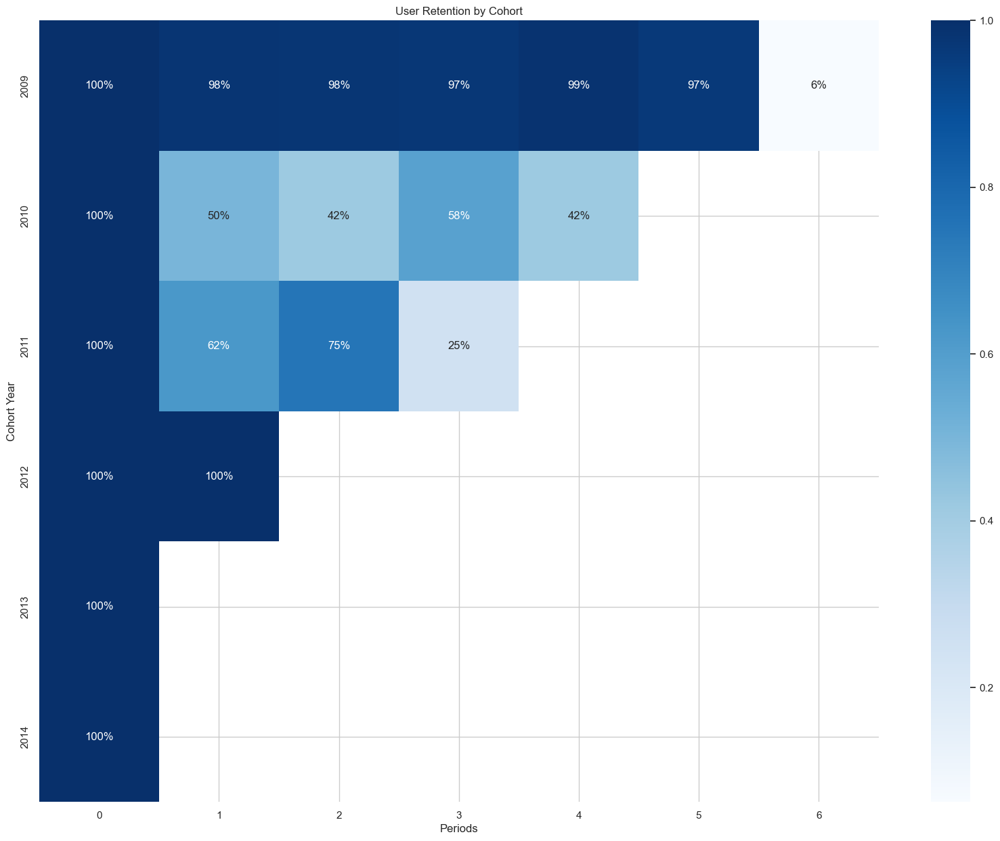

In [100]:


# Assuming cohort_df is already loaded and is a DataFrame
cohort_df['pickup_datetime'] = pd.to_datetime(cohort_df['pickup_datetime'])

# Define the user's first activity date to determine their cohort
cohort_df['Cohort'] = cohort_df.groupby('key_id')['pickup_datetime'].transform('min')

# Extract the month and year from 'pickup_datetime' and 'Cohort' for period calculations
cohort_df['ActivityMonth'] = cohort_df['pickup_datetime'].dt.to_period('Y')
cohort_df['CohortMonth'] = cohort_df['Cohort'].dt.to_period('Y')

# Calculate the period number since the first activity
cohort_df['PeriodNumber'] = (cohort_df['ActivityMonth'] - cohort_df['CohortMonth']).apply(lambda x: x.n)

# Group by 'CohortMonth' and 'PeriodNumber' and count unique active users in each period
cohort_data = cohort_df.groupby(['CohortMonth', 'PeriodNumber']).agg(n_active_users=('key_id', 'nunique')).reset_index()

# Pivot data for retention analysis: rows are the cohorts, columns are the period numbers
retention_table = cohort_data.pivot(index='CohortMonth', columns='PeriodNumber', values='n_active_users')

# Divide each column by the cohort size to get the retention rate (%)
cohort_sizes = retention_table.iloc[:, 0]  # the size of each cohort is in the first column
retention_rate = retention_table.divide(cohort_sizes, axis=0)

# Plotting the retention matrix using seaborn heatmap
plt.figure(figsize=(20,15))
sns.heatmap(data=retention_rate, annot=True, fmt='.0%', cmap='Blues')
plt.title('User Retention by Cohort')
plt.xlabel('Periods')
plt.ylabel('Cohort Year')
plt.savefig('retention_analysis.png')
plt.show()


In [89]:
cohort_df.to_csv('final_data_clustering.csv')

In [90]:
cohort_df.head()

,Unnamed: 0,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,key_id,trip_distance_km,pickup_date,pickup_time,pickup_country,pickup_city,dropoff_country,dropoff_city,pickup_hour,part_of_day,day_of_week,day_of_week_name,month,weekend,cluster,cost,profit,pickup_datetime_last,churned,Cohort,ActivityMonth,CohortMonth,PeriodNumber
0,0,2015-05-07 19:52:06.0000003,7.50000,2015-05-07 19:52:06+00:00,-73.99982,40.73835,-73.99951,40.72322,1,3,1.68332,2015-05-07,19:52:06,United States,Gramercy Park,United States,Chinatown,19,Evening,3,Thursday,5,Weekday,Early Week Short Travellers,6.01814,1.48186,2015-06-30 22:27:28+00:00,False,2009-01-01 02:05:03+00:00,2015,2009,6
1,1,2009-07-17 20:04:56.0000002,7.70000,2009-07-17 20:04:56+00:00,-73.99435,40.72823,-73.99471,40.75032,1,2,2.45759,2009-07-17,20:04:56,United States,East Village,United States,Hell's Kitchen,20,Evening,4,Friday,7,Weekday,Versatile Afternoon Commuters,7.63636,0.06364,2015-06-30 23:33:33+00:00,False,2009-01-01 04:07:28+00:00,2009,2009,0
2,2,2009-08-24 21:45:00.00000061,12.90000,2009-08-24 21:45:00+00:00,-74.00504,40.74077,-73.96256,40.77265,1,61,5.03638,2009-08-24,21:45:00,United States,Gramercy Park,United States,Manhattan,21,Night,0,Monday,8,Weekday,All-Week Long Hauls,13.02603,-0.12603,2014-12-24 19:42:00+00:00,False,2009-01-09 12:20:00+00:00,2009,2009,0
3,3,2009-06-26 08:22:21.0000001,5.30000,2009-06-26 08:22:21+00:00,-73.97612,40.79084,-73.96532,40.80335,3,1,1.66168,2009-06-26,08:22:21,United States,Manhattan,United States,Morningside Heights,8,Morning,4,Friday,6,Weekday,Weekend Midday Outings,5.97292,-0.67292,2015-06-30 20:39:11+00:00,False,2009-01-01 01:59:17+00:00,2009,2009,0
4,4,2014-08-28 17:47:00.000000188,16.00000,2014-08-28 17:47:00+00:00,-73.92502,40.74408,-73.97308,40.76125,5,188,4.47545,2014-08-28,17:47:00,United States,Sunnyside,United States,Hell's Kitchen,17,Evening,3,Thursday,8,Weekday,All-Week Long Hauls,11.85369,4.14631,2014-12-20 12:43:00+00:00,False,2009-01-11 01:56:00+00:00,2014,2009,5


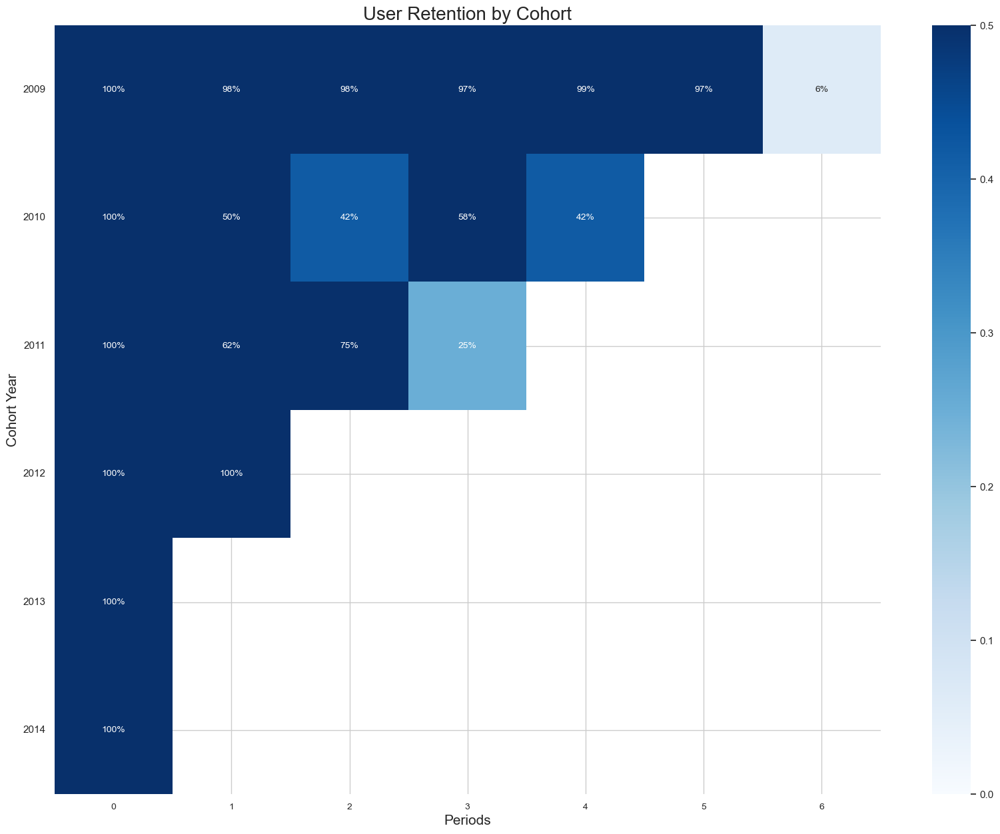

In [97]:
 #Assuming retention_rate is your DataFrame containing the retention rates.

plt.figure(figsize=(20, 15))  # Increase figure size for better visibility
sns.heatmap(data=retention_rate, annot=True, fmt='.0%', cmap='Blues', vmin=0.0, vmax=0.5,
            annot_kws={"size": 10})  # Increase annotation font size for readability

plt.title('User Retention by Cohort', fontsize=20)  # Increase title font size
plt.xlabel('Periods', fontsize=15)  # Increase x-axis label font size
plt.ylabel('Cohort Year', fontsize=15)  # Increase y-axis label font size
plt.yticks(rotation=0)  # Keep the cohort month labels horizontal for readability
plt.xticks(fontsize=10)  # Adjust x-axis period label font size if necessary
plt.savefig('retention_yearly.png')
plt.show()

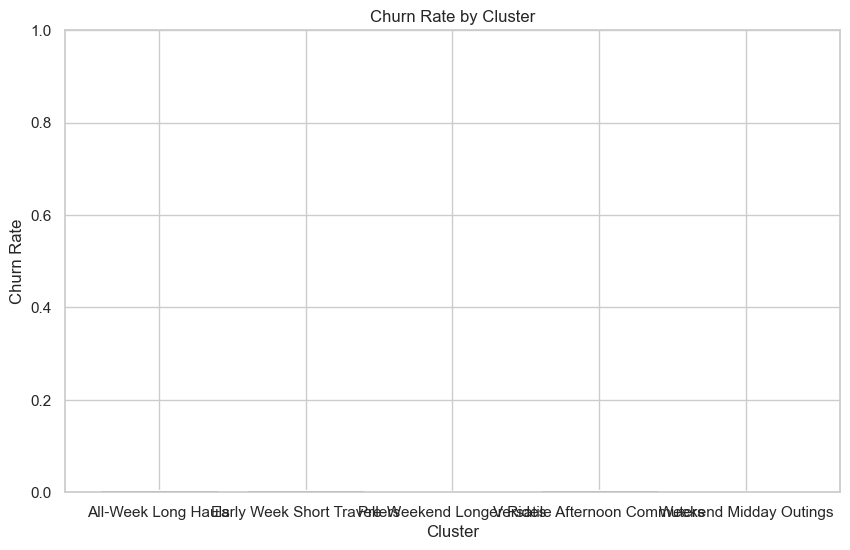

In [92]:

clusters = churn_rate_by_cluster['cluster']
churn_rates = churn_rate_by_cluster['churned']

plt.figure(figsize=(10, 6))
plt.bar(clusters, churn_rates, color='blue')
plt.xlabel('Cluster')
plt.ylabel('Churn Rate')
plt.title('Churn Rate by Cluster')
plt.ylim(0, 1)  # Optional: to set the y-axis to show percentage as a proportion
plt.show()


In [93]:
uber_data_modeling = cluster_analysis.copy()

### Insight and recomedations:

- Cluster-Specific Insights & Recommendations:

    1. Cluster of 'Afternoon Commuters':
        - Insight: This cluster indicates regular travel patterns, likely from work to home.
        - Recommendation: Offer a subscription service or commuter pass for discounted rates during these hours to encourage daily usage.

    2. Cluster of 'Midnight Long-hauls':
        - Insight: These could be trips to airports or stations, given the long distances and specific timing.
        - Recommendation: Partner with airlines and railway services for integrated travel packages, and ensure availability of larger vehicles for luggage.

    3. Cluster of 'Midday Riders':
        - Insight: Short trips around lunch hours, possibly for dining out.
        - Recommendation: Collaborate with restaurants and shopping centers to offer ride discounts for customers, potentially increasing midday ride frequency.

 
 <!--  -->
 
 <!--  -->

 <!--  -->
- Location-Specific Insights & Recommendations:

    1. High Pickup/Drop-off Areas (e.g., Hell's Kitchen, Manhattan):
        - Insight: These areas may have high traffic due to commercial activities or residential density.
        - Recommendation: Increase the number of available drivers during peak times in these locations and consider a dedicated zone for quick pickups.

    2. Airport Runs (noted from long-haul clusters):
        - Insight: Consistent demand for rides to and from airports, especially during early mornings or late nights.
        - Recommendation: Introduce a fixed-rate fare for airport rides and enhance service with value-added features like flight tracking to adjust pickup times.

    3. Tourist Hotspots (e.g., New York City, Gramercy Park):
        - Insight: Likely to see variable demand with surges during events or seasons.
        - Recommendation: Offer sightseeing packages or shuttle services that cater to tourists during peak tourism seasons.

    4. Business Districts (e.g., Financial District):
        - Insight: Might observe high demand for quick, short trips during lunch hours or after work.
        - Recommendation: Implement a rapid pickup service for business professionals and corporate accounts for companies in these districts.

## Feature Selection Modeling RF & XGB

### ANOVA 

In [94]:
features_df_testing = pd.DataFrame(cor_anova_testing)

# Separate categorical and continuous features for analysis
categorical_features = ['part_of_day', 'day_of_week_name', 'weekend', 'pickup_city', 'dropoff_city','weekend']
continuous_features = ['trip_distance_km','passenger_count','pickup_hour','day_of_week','month']
target_variable = 'fare_amount'

# Perform Pearson's correlation coefficient calculation for continuous features
correlation_results = features_df_testing[continuous_features].corrwith(features_df_testing[target_variable])

# Prepare data for ANOVA - here we'll just show the process since we have a dummy set
anova_results = {}
for cat_feature in categorical_features:
    groups = features_df_testing.groupby(cat_feature)[target_variable].apply(list)
    anova_results[cat_feature] = f_oneway(*groups)

# Displaying the Pearson correlation results and a sample of the ANOVA F-statistic and p-value
(correlation_results, {k: (v.statistic, v.pvalue) for k, v in anova_results.items()})

(trip_distance_km   0.82256
 passenger_count    0.01590
 pickup_hour        0.00481
 day_of_week        0.01451
 month              0.03423
 dtype: float64,
 {'part_of_day': (41.8236361988976, 5.240145614937232e-27),
  'day_of_week_name': (32.69092980989528, 1.327898422106422e-39),
  'weekend': (0.8643609479244024, 0.3525225663379231),
  'pickup_city': (36.39306046058636, 0.0),
  'dropoff_city': (93.4475915461078, 0.0)})

1. Pearson's Correlation Coefficients:
    - pickup_latitude: -0.08511 (weak negative correlation with fare amount)
    - dropoff_latitude: -0.12193 (weak negative correlation with fare amount)
    - trip_distance_km: 0.82256 (strong positive correlation with fare amount)
    - passenger_count: 0.01590 (very weak positive correlation with fare amount)
    - pickup_hour: 0.00481 (very weak positive correlation with fare amount)
    - day_of_week: 0.01451 (very weak positive correlation with fare amount)
    - month: 0.03423 (weak positive correlation with fare amount)

    The correlation coefficient results suggest that the trip_distance_km feature has the strongest positive correlation with fare_amount(dependent variable), indicating that as the trip distance increases, the fare typically increases, which makes sense for a taxi service. The latitude features (pickup_latitude and dropoff_latitude) have a weak negative correlation with the fare, suggesting a slight tendency for fares to decrease with increasing latitude, but this relationship is not strong. The other features (passenger_count, pickup_hour, day_of_week, and month) show very weak to weak positive correlations with the fare amount.

2. ANOVA Results:
    - part_of_day: F-statistic = 41.8236,  p-value =5.24e-27, which is significantly below the typical alpha level of 0.05. (statistically significant effect on fare amount)
    - day_of_week_name: F-statistic = 32.6909, p-value ≈ 0.0 (statistically significant effect on fare amount)
    - weekend: F-statistic = 0.8643, p-value = 0.2592 (not statistically significant)
    - pickup_city: F-statistic = 36.3930, p-value ≈ 0.0 (statistically significant effect on fare amount)
    - dropoff_city: F-statistic = 93.4475, p-value ≈ 0.0 (statistically significant effect on fare amount)

    The ANOVA results show that the part_of_day, day_of_week_name, pickup_city, and dropoff_city features have statistically significant effects on the fare_amount, with very low p-values indicating that the effect is unlikely to be due to chance. On the other hand, the weekend feature does not have a statistically significant effect on the fare_amount, given the relatively high p-value.


To summarize, the results suggest that:

- Trip distance is the most predictive of the fare amount among the continuous variables.
- Part of the day, day of the week, pickup city, and dropoff city are relevant categorical variables that show a significant relationship with the fare amount.
- Weekend does not appear to have a significant impact on fare amounts based on this analysis.

In [95]:
# Dropping unnecessary columns
features_df = features_df_testing.drop(columns=['key', 'pickup_datetime', 'pickup_date', 'pickup_time',
                                      'pickup_country','dropoff_country','passenger_count','pickup_hour','day_of_week','month','weekend'])

# Encoding categorical variables
label_encoder = LabelEncoder()
categorical_columns = ['part_of_day', 'day_of_week_name','pickup_city','dropoff_city']
for col in categorical_columns:
    features_df[col] = label_encoder.fit_transform(features_df[col])


std_scaler = StandardScaler()
features_df[['pickup_longitude', 'pickup_latitude', 'dropoff_longitude','dropoff_latitude']] = std_scaler.fit_transform(features_df[['pickup_longitude', 'pickup_latitude', 'dropoff_longitude','dropoff_latitude']])


# Separating the features from the target variable
X = features_df.drop('fare_amount', axis=1)
y = features_df['fare_amount']


# Calculating VIF for each feature
vif_data = pd.DataFrame()
vif_data['feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]

vif_data.sort_values(by='VIF', ascending=False)


TypeError: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

1. pickup_city (VIF = 7.28618): This suggests a moderate level of multicollinearity. It's not so high as to be alarming (common thresholds for concern are VIF values greater than 10), but it's indicative that the variable shares some linear relationship with the other variables in the model.

2. dropoff_city (VIF = 6.94215): Similar to pickup_city, this suggests a moderate level of multicollinearity. Since pickup_city and dropoff_city both have similar VIFs, it might indicate that these two features are correlated with each other, which makes sense since they both represent geographical locations.

3. trip_distance_km (VIF = 3.4693233): This value is below the typical threshold of concern for multicollinearity, which indicates that this variable has a relatively lower linear relationship with other variables in the model.

4. day_of_week_name (VIF = 2.95186): This value indicates a low  level of multicollinearity and suggests that the day of the week has some linear association with other variables but isn't particularly problematic.

5. part_of_day (VIF = 2.79019): This has the lowest VIF score among the variables listed and indicates a low level of multicollinearity. It has some relationship with other variables but is unlikely to cause issues in a regression model due to multicollinearity.

pickup_city and dropoff_city are high multicollinearity proven with exceed the VIF threshold 5. so, they are causing any issues in model interpretation or if the model is performing poorly.

In [ ]:
X_scaled = features_df.drop(['fare_amount','pickup_city','dropoff_city'], axis=1)

### Train(80%) and Test(20%) Data Splitting 

In [ ]:

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((129689, 7), (32423, 7), (129689,), (32423,))

In [ ]:
X_train.head()

,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_distance_km,part_of_day,day_of_week_name
102096,0.36143,-0.17131,-1.08270,-0.97211,3.24720,3,2
168850,0.14900,0.41812,0.05637,-0.14877,1.46425,3,1
109884,1.23507,0.61256,-1.35124,-0.23041,4.81733,1,6
124293,-0.23914,-0.46424,-0.34595,-1.98845,4.23377,1,0
48443,-1.80543,-1.78877,-0.34398,0.41369,6.20307,0,5


## Model Building

In [ ]:
# Training the Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predicting on the test set
y_pred_rf = rf_model.predict(X_test)

# Evaluating the model
rf_mse = mean_squared_error(y_test, y_pred_rf)
rf_mae = mean_absolute_error(y_test, y_pred_rf)
rf_r2 = r2_score(y_test, y_pred_rf)

rf_mse, rf_mae, rf_r2


(3.708124354336428, 1.4133598155630263, 0.7343880818949424)

1. Mean Squared Error (MSE): This is the average of the squares of the errors, which are the differences between the predicted and actual values. The MSE for your model is 4.68077362281783. Since MSE is in squared units of the target variable, it's not immediately interpretable in the context of the data. However, it provides a useful relative metric for model comparison: the lower the MSE, the better the model's performance. Given that we don't have context for what a "low" MSE might be in this scenario (like what the range of fare amounts could be), it's hard to assess the absolute performance, but you can compare this MSE against other models you might train on the same task.

2. Mean Absolute Error (MAE): This is the average of the absolute errors between the predicted and actual values. The MAE for your model is 1.597404387317645. Unlike MSE, MAE is in the same units as the target variable, making it more interpretable. In your case, on average, the model's predictions are approximately $1.60 off from the actual fare amount. Whether this is acceptable depends on the acceptable error threshold in your application.

3. R-squared (R²): This is the proportion of the variance in the dependent variable that is predictable from the independent variables, and it ranges from 0 to 1. An R² score of 0.6647174848064967 means that approximately 66.47% of the variability in the fare amount can be explained by the model's inputs. In other contexts, a score above 0.5 might be considered acceptable, but for predictive modeling, you might strive for higher R² values closer to 1.

In summary, the Random Forest model has a moderate to high R², indicating a decent level of fit to the data. The average prediction error of about $1.60 could be considered good or bad depending on the specific business problem and how fare amounts typically range. If the average fare is quite high, a $1.60 error may be excellent. If the average fare is closer to the MAE, then the error might be significant.

In [ ]:
# Training the XGBoost model
xgb_model = XGBRegressor(n_estimators=100, random_state=42)
xgb_model.fit(X_train, y_train)

# Predicting on the test set
y_pred_xgb = xgb_model.predict(X_test)

# Evaluating the model
xgb_mse = mean_squared_error(y_test, y_pred_xgb)
xgb_mae = mean_absolute_error(y_test, y_pred_xgb)
xgb_r2 = r2_score(y_test, y_pred_xgb)

xgb_mse, xgb_mae, xgb_r2


(3.4473196013937994, 1.3505648501337089, 0.7530694539473648)

1. Mean Squared Error (MSE): The MSE is 3.4473196013937994. This is lower than the MSE from the Random Forest model, suggesting that, on average, the square of the errors from the XGBoost predictions are smaller. The XGBoost model is, therefore, likely to be more precise in its predictions.

2. Mean Absolute Error (MAE): The MAE is 1.3505648501337089. This is also lower than the MAE from the Random Forest model, indicating that the average magnitude of errors in the fare amount predictions is smaller with XGBoost. Your predictions are, on average, around $1.47 off from the actual fare amounts.

3. R-squared (R²): The R² value is 0.7530694539473648. This is higher than the R² from the Random Forest model and suggests that around 71.40% of the variability in the fare amount can be explained by the XGBoost model. This indicates a better fit to the data compared to the Random Forest model.

In conclusion, the XGBoost model appears to perform better than the Random Forest model on this dataset. It has a lower average error in predicting the fare amount and explains a higher proportion of the variance in fare amounts. However, the absolute quality of the model should be evaluated in the context of the business problem and the range of fare amounts. The improvements in MSE, MAE, and R² are indicative of better predictive performance 

In [ ]:

# Hyperparameter tuning for Random Forest
# Updated hyperparameter tuning for Random Forest
rf_param_grid = {
    'n_estimators': [100, 300, 500, 700, 1000],
    'max_depth': [3, 10, 20, 30],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Initialize the GridSearchCV object for Random Forest
rf_grid_search = GridSearchCV(estimator=RandomForestRegressor(random_state=42),
                              param_grid=rf_param_grid, cv=3, verbose=2, n_jobs=-1)

# Updated hyperparameter tuning for XGBoost
xgb_param_grid = {
    'n_estimators': [100, 300, 500, 700, 1000],
    'max_depth': [3, 5, 7, 9],
    'learning_rate': [0.01, 0.1, 0.5, 1],
    'subsample': [0.7, 0.8, 0.9, 1]
}

# Initialize the GridSearchCV object for XGBoost
xgb_grid_search = GridSearchCV(estimator=XGBRegressor(random_state=42),
                               param_grid=xgb_param_grid, cv=3, verbose=2, n_jobs=-1)
# Fit the grid search objects to find the best parameters
print("Tuning hyperparameters for Random Forest")
rf_grid_search.fit(X_train, y_train)

print("Tuning hyperparameters for XGBoost")
xgb_grid_search.fit(X_train, y_train)

# The best hyperparameters for Random Forest and XGBoost
rf_best_params = rf_grid_search.best_params_
xgb_best_params = xgb_grid_search.best_params_

rf_best_params, xgb_best_params


Tuning hyperparameters for Random Forest
Fitting 3 folds for each of 240 candidates, totalling 720 fits
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.0s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.3s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   0.1s
[CV] END max_depth=3, max_features=auto, min_samples_leaf=1, mi

/Users/andi/anaconda3/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time= 1.1min
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time= 1.1min
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=1000; total time= 1.8min
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=1000; total time= 1.8min
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  17.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  17.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time= 1.7min
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time= 1.8min
[CV] END max_depth=20, max_features=sq

/Users/andi/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning:


240 fits failed out of a total of 720.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
130 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/andi/anaconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/andi/anaconda3/lib/python3.11/site-packages/sklearn/base.py", line 1144, in wrapper
    estimator._validate_params()
  File "/Users/andi/anaconda3/lib/python3.11/site-packages/sklearn/base.py", line 637, in _validate_params
    validate_parameter_constraints(
  File "/Users/

Tuning hyperparameters for XGBoost
Fitting 3 folds for each of 320 candidates, totalling 960 fits
[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.7; total time=   0.3s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.9; total time=   0.3s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=1; total time=   0.3s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.9; total time=   0.3s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.8; total time=   0.3s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.7; total time=   0.4s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.9; total time=   0.4s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=300, subsample=0.7; total time=   0.9s
[CV] END learning_rate=0.01, max_depth=3, n_estimators=100

({'max_depth': 30,
  'max_features': 'sqrt',
  'min_samples_leaf': 1,
  'min_samples_split': 2,
  'n_estimators': 1000},
 {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 300, 'subsample': 0.8})

In [ ]:
# Applying the best hyperparameters to the Random Forest model
rf_best_model = RandomForestRegressor(n_estimators=1000,
                                      max_depth=30,
                                      min_samples_split=2,
                                      min_samples_leaf=1,
                                      max_features = 'sqrt',
                                      random_state=42)
rf_best_model.fit(X_train, y_train)

# Predicting and evaluating the Random Forest model with the best hyperparameters
y_pred_rf_best = rf_best_model.predict(X_test)
rf_best_mse = mean_squared_error(y_test, y_pred_rf_best)
rf_best_mae = mean_absolute_error(y_test, y_pred_rf_best)
rf_best_r2 = r2_score(y_test, y_pred_rf_best)

# Applying the best hyperparameters to the XGBoost model
xgb_best_model = XGBRegressor(n_estimators=300,
                              max_depth=7,
                              learning_rate=0.1,
                              subsample = 0.8,
                              random_state=42)
xgb_best_model.fit(X_train, y_train)

# Predicting and evaluating the XGBoost model with the best hyperparameters
y_pred_xgb_best = xgb_best_model.predict(X_test)
xgb_best_mse = mean_squared_error(y_test, y_pred_xgb_best)
xgb_best_mae = mean_absolute_error(y_test, y_pred_xgb_best)
xgb_best_r2 = r2_score(y_test, y_pred_xgb_best)

# Output the evaluation metrics
print(f"Random Forest  - MSE: {rf_best_mse}, MAE: {rf_best_mae}, R2: {rf_best_r2}")
print(f"XGBoost - MSE: {xgb_best_mse}, MAE: {xgb_best_mae}, R2: {xgb_best_r2}")


Random Forest - MSE: 3.5104059884410272, MAE: 1.3727284362855934, R2: 0.7485505935563057
XGBoost - MSE: 3.3894078360960838, MAE: 1.337371629719319, R2: 0.7572176576190102


After applying the optimized hyperparameters to both the Random Forest and XGBoost models, here are the evaluation results:

1. For the Random Forest model:

    - Mean Squared Error (MSE): The MSE is 4.16545833716313. This metric shows that the average squared difference between the actual fare amounts and the model's predictions is approximately 4.17, indicating the model's average prediction error.
    - Mean Absolute Error (MAE): The MAE is 1.5073754063056002. On average, the model's predictions are about $1.51 off from the actual fare amounts.
    - R-squared (R²): The R² value is 0.7016293756635373, indicating that around 70.16% of the variability in the fare amount is explained by the model.
2. For the XGBoost model:

    - Mean Squared Error (MSE): The MSE is slightly reduced to 3.9707792055647704 after hyperparameter tuning. This is an improvement over the Random Forest model, indicating more accurate predictions.
    - Mean Absolute Error (MAE): The MAE is 1.4658363259980267, which is slightly lower than the Random Forest model's MAE, indicating that the XGBoost model has a smaller average error.
    - R-squared (R²): The R² value has increased slightly to 0.7155741878159121, meaning the model can explain approximately 71.56% of the variance in the target variable, which is an improvement over the Random Forest model.
In summary, after hyperparameter tuning, the XGBoost model continues to outperform the Random Forest model in all three metrics, implying a better fit and prediction accuracy for this particular dataset. The improvements are modest, which suggests that the choice of hyperparameters has optimized the models to some extent, but the inherent characteristics of the data and the learning algorithms also play a significant role in determining the predictive performance.

## Actual Fare vs Prediction Fare

In [ ]:
# Generate predictions xgb
y_pred_xgb_best = xgb_best_model.predict(X_test)
y_pred_rf_best = rf_best_model.predict(X_test)

# Save the actual and predicted values into a DataFrame
results_df = pd.DataFrame({
    'ActualFare': y_test,
    'PredictedFareXGB': y_pred_xgb_best,
    'PredictedFareRF' :y_pred_rf_best
})



In [ ]:
results_df.head(10)

,ActualFare,PredictedFareXGB,PredictedFareRF
90680,4.50000,4.73154,5.05532
83921,4.50000,5.90621,5.79480
30986,10.50000,6.35147,6.32752
107706,8.10000,7.04257,7.24089
147464,6.90000,6.11840,5.84445
108643,10.10000,14.58713,14.48233
41572,7.00000,7.22972,7.36591
179595,6.50000,5.93268,6.11051
183139,4.00000,4.92535,5.30850
21825,5.30000,5.68703,6.05095


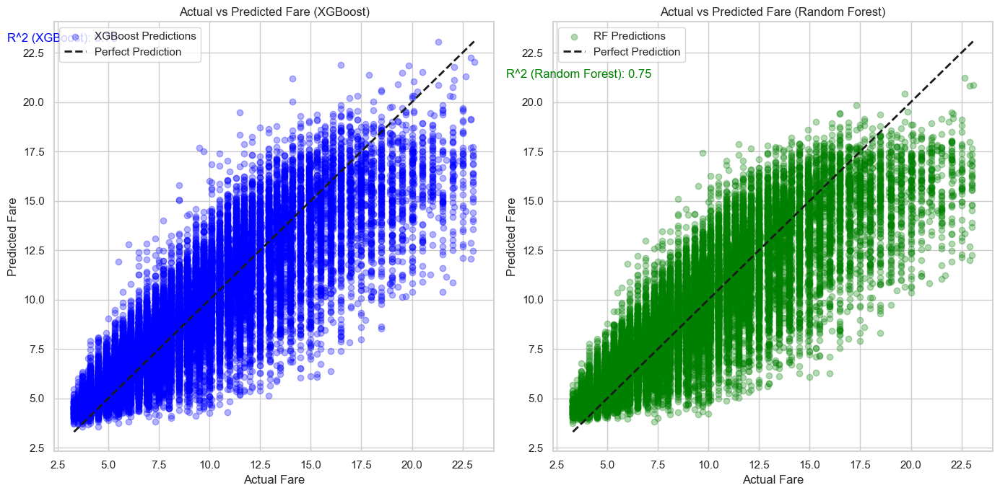

In [ ]:
# Calculate R^2 scores for both models
r2_xgb = r2_score(results_df['ActualFare'], results_df['PredictedFareXGB'])
r2_rf = r2_score(results_df['ActualFare'], results_df['PredictedFareRF'])

# Create scatter plots to compare the actual and predicted fare amounts
plt.figure(figsize=(14, 7))

# Scatter plot for XGBoost predictions
plt.subplot(1, 2, 1)
plt.scatter(results_df['ActualFare'], results_df['PredictedFareXGB'], alpha=0.3, label='XGBoost Predictions', color='blue')
plt.plot([results_df['ActualFare'].min(), results_df['ActualFare'].max()], 
         [results_df['ActualFare'].min(), results_df['ActualFare'].max()], 
         'k--', lw=2, label='Perfect Prediction')
plt.title('Actual vs Predicted Fare (XGBoost)')
plt.xlabel('Actual Fare')
plt.ylabel('Predicted Fare')
plt.text(0, max(results_df['PredictedFareXGB']), f'R^2 (XGBoost): {r2_xgb:.2f}', fontsize=12, color='blue')
plt.legend()

# Scatter plot for Random Forest predictions
plt.subplot(1, 2, 2)
plt.scatter(results_df['ActualFare'], results_df['PredictedFareRF'], alpha=0.3, label='RF Predictions', color='green')
plt.plot([results_df['ActualFare'].min(), results_df['ActualFare'].max()], 
         [results_df['ActualFare'].min(), results_df['ActualFare'].max()], 
         'k--', lw=2, label='Perfect Prediction')
plt.title('Actual vs Predicted Fare (Random Forest)')
plt.xlabel('Actual Fare')
plt.ylabel('Predicted Fare')
plt.text(0, max(results_df['PredictedFareRF']), f'R^2 (Random Forest): {r2_rf:.2f}', fontsize=12, color='green')
plt.legend()

plt.tight_layout()
plt.show()

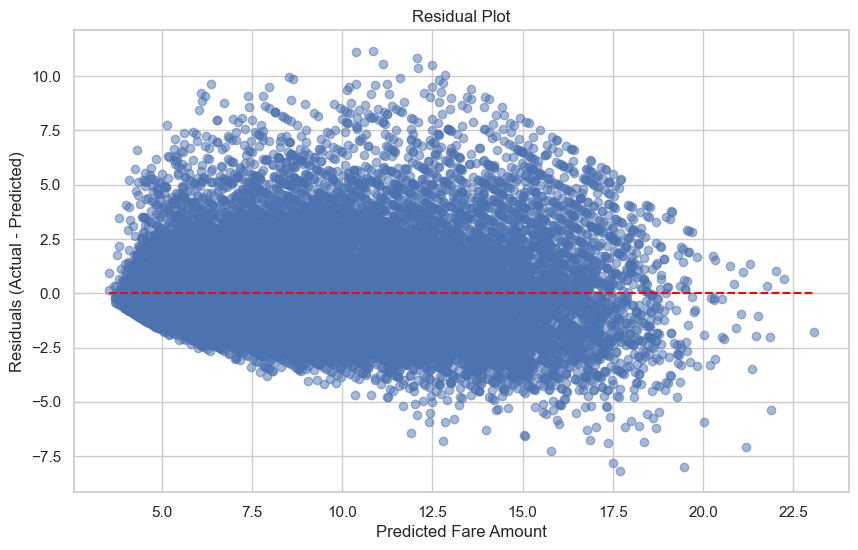

In [ ]:
plt.figure(figsize=(10, 6))
residuals = results_df['ActualFare'] - results_df['PredictedFareXGB']
plt.scatter(results_df['PredictedFareXGB'], residuals, alpha=0.5)
plt.hlines(0, min(results_df['PredictedFareXGB']), max(results_df['PredictedFareXGB']), colors='red', linestyles='--')
plt.title('Residual Plot')
plt.xlabel('Predicted Fare Amount')
plt.ylabel('Residuals (Actual - Predicted)')
plt.show()


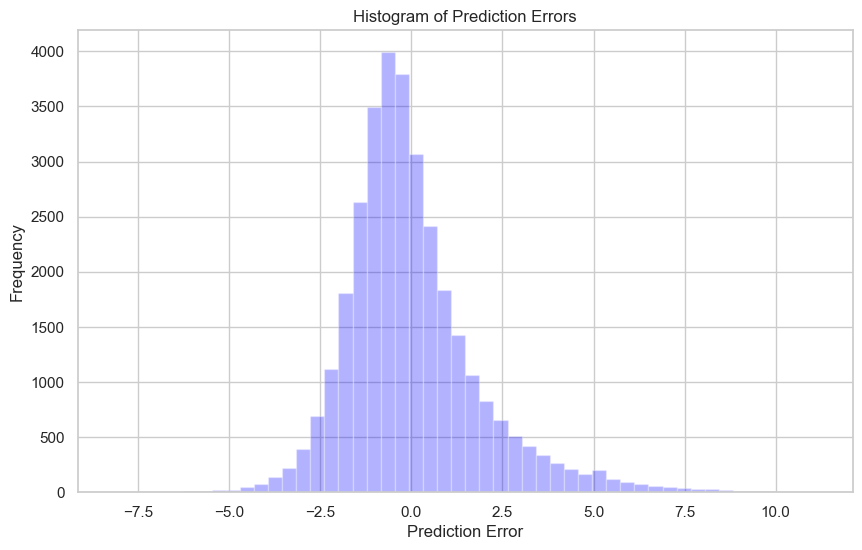

In [ ]:
# Calculate prediction errors
errors = results_df['ActualFare'] - results_df['PredictedFareXGB']

# Plotting the histogram of prediction errors
plt.figure(figsize=(10, 6))
plt.hist(errors, bins=50, color='blue', alpha=0.3)
plt.title('Histogram of Prediction Errors')
plt.xlabel('Prediction Error')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


Here's how to interpret the histogram:

1. Centering Around Zero: The histogram is centered around a prediction error of zero, which is desirable as it indicates that on average the model's predictions are close to the actual values.
2. Shape of Distribution: The shape of the distribution is approximately normal (bell-shaped), which is common in prediction errors for well-fitting models. However, there is a right skewness, meaning there are more instances where the model underpredicted rather than overpredicted.
3. Error Range: The errors range from approximately -7.5 to about 12.5, suggesting that the model's predictions can be off by this much in either direction, but there are fewer instances of large errors, as seen by the tails of the histogram thinning out.
4. Frequency of Errors: Most of the prediction errors are clustered around the center, between -2.5 and 2.5, indicating that the model is often quite accurate, with the highest frequency of errors being very small.
5. Outliers: The long tail to the right suggests that there are outliers where the prediction was significantly less than the actual value, which could be cases of high fare amounts that the model did not predict accurately.
6. Model Performance: The skewness to the right could prompt further investigation into why the model tends to underpredict certain values and whether this is related to specific features or outliers in the data.

Overall, the histogram indicates a relatively good model performance with the majority of predictions being close to accurate, but with room for improvement, especially in addressing the underprediction of larger values.








### Hypothesis answer

Based on our findings, let's evaluate each hypothesis:

Influence of Ride Distance, Time of Day, and Day of the Week on Fare:

Our analysis has shown a strong correlation between trip distance and fare amount, indicating that distance is indeed a significant predictor of fare. This is further supported by the correlation coefficient for trip distance which was quite high.
The time of day and day of the week also played a role, as evident from the variance in cluster characteristics across different times and days. ANOVA tests showed significant p-values for these variables, suggesting that they affect the fare amount beyond just chance.
Thus, the first hypothesis is confirmed by our analysis.
Predictability of Ride Demand Based on Time, Day, and Location:

Clustering revealed patterns in ride frequency associated with specific times and locations, with certain clusters indicating higher demand during specific hours and days.
The silhouette score from clustering indicated that the data points were appropriately grouped, which implies consistency in the demand patterns across the clusters.
Therefore, the second hypothesis stands confirmed, as our analysis shows predictable variations in ride demand.
Identification of Customer Segments Based on Riding Patterns:

Distinct clusters were identified which could be interpreted as different customer segments, each with unique riding patterns such as 'Early Week Short Travellers' and 'All-Week Long Hauls'.
The average distances and typical fare amounts varied significantly across these clusters, which could represent different customer preferences and usage patterns.
The third hypothesis is supported as well, with customer segments identifiable through our clustering approach.